## Previsione vendite di un e-commerce con il Deep Learning

Implementazione di una architettura custom, derivata dall'architettura Transformers, per la realizzazione di un modello predittivo
per le vendite di un e-commerce. In particolare, il modello dovrà essere in grado di <u>prevedere le quantità che saranno
vendute nei successivi 7 giorni</u> e fornire indicazioni riguardo i <u>trend delle vendite nei successivi 30 giorni</u>.

Il dataset utilizzato riporta le vendite totali giornaliere dei seguenti reparti di un ecommerce:
* smartphone
* frigoriferi
* tv
* cuffie
* aspirapolvere
* notebook
* bollitori
* lavatrici
* tavoli
* mouse

Con lo scopo di mantenere anonimo il cliente da cui i dati derivano, <u>alcuni reparti sono stati rinominati e sono
riportate le vendite giornaliere aggregate per reparto e non per singolo articolo</u>.

I dati sono nell'intervallo di date dal 1/1/2016 al 22/06/2021.



Nel notebook sono utilizzate diverse procedure per analizzare i dati disponibili e per visualizzarli evidenziandone alcuni
aspetti. Sono inoltre inserite alcune procedure di arricchimento del dataset sfruttando dati esterni, come i giorni
festivi e prefestivi in Italia ed eventi come il black-friday.

In [2]:
import os
import pickle
import seaborn as sns
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from workalendar.europe import Italy
from workalendar.usa import California
import tensorflow as tf

# configurazione per far ignorare le divisioni
# per 0 che avvengono in alcuni calcoli che
# coinvolgono quantità vendute pari a zero
np.seterr(divide='ignore', invalid='ignore')

import locale
# per forzare le impostazioni in italiano si può
# sostituire la seguente linea di codice con:
# locale.setlocale(locale.LC_ALL, 'it_IT')
# altrimenti vengono utilizzate le impostazioni
# del sistema operativo sottostante
locale.setlocale(locale.LC_ALL, '')

2024-10-22 14:54:42.643873: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-22 14:54:42.679303: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-22 14:54:42.688142: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-22 14:54:42.749854: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-22 14:54:44.283822: W tensorflow/compiler/tf2

'C.UTF-8'

In [3]:
# directory che contiene i dati necessari al notebook
percorso_base = 'data/'

## Preparazione del DataSet

### Carichiamo il DataSet

In [4]:
# importare il CSV con i dati tramite il metodo [read_csv] dei
# dataframe di Pandas, specificando da quale colonna recuperare
# l'indice (la colonna "data") e indicando di utilizzare i dati
# di questa colonna come dati di tipo datetime
df = pd.read_csv("data.csv",
                 parse_dates=['date'],
                 index_col=['date'])

# conversione dei dati del dataframe in formato intero
# (sono quantità e non sono presenti quantità frazionarie)
df = df.astype(int)

### Studiamo il DataSet

Procediamo con l'analisi dei dati a disposizione per capire come meglio strutturarli ai fini della costruzione
di un modello predittivo.

In [5]:
# visualizzazione delle prime 5 righe del dataset [df]
df.head()

,smartphone,abbigliamento,libri,cosmetici,scarpe,notebook,borse,cancelleria,giardinaggio,cucina
date,,,,,,,,,,
2016-01-01,60,30,33,12,6,34,23,25,75,59
2016-01-02,45,38,27,27,14,36,21,19,71,50
2016-01-03,51,37,7,23,15,37,16,28,72,49
2016-01-04,57,39,16,20,19,37,21,15,69,42
2016-01-05,71,44,25,24,9,41,7,28,70,57


In [6]:
print("Shape di df:", df.shape)

Shape di df: (2000, 10)


### Controlliamo la presenza di valori NaN nel DataSet

In [7]:
for colonna in df.columns:
    print('Ci sono dei NaN in', colonna, '?', 'Si' if df[colonna].isnull().values.any() else 'No')

Ci sono dei NaN in smartphone ? No
Ci sono dei NaN in abbigliamento ? No
Ci sono dei NaN in libri ? No
Ci sono dei NaN in cosmetici ? No
Ci sono dei NaN in scarpe ? No
Ci sono dei NaN in notebook ? No
Ci sono dei NaN in borse ? No
Ci sono dei NaN in cancelleria ? No
Ci sono dei NaN in giardinaggio ? No
Ci sono dei NaN in cucina ? No


Stampiamo le informazioni sul dataset relativamente a tipologia di dati presenti e eventuali valori nulli presenti.

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2000 entries, 2016-01-01 to 2021-06-22
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   smartphone     2000 non-null   int64
 1   abbigliamento  2000 non-null   int64
 2   libri          2000 non-null   int64
 3   cosmetici      2000 non-null   int64
 4   scarpe         2000 non-null   int64
 5   notebook       2000 non-null   int64
 6   borse          2000 non-null   int64
 7   cancelleria    2000 non-null   int64
 8   giardinaggio   2000 non-null   int64
 9   cucina         2000 non-null   int64
dtypes: int64(10)
memory usage: 171.9 KB


In [9]:
# visualizzazione dei soli tipi di dato di ogni colonna
df.dtypes

smartphone       int64
abbigliamento    int64
libri            int64
cosmetici        int64
scarpe           int64
notebook         int64
borse            int64
cancelleria      int64
giardinaggio     int64
cucina           int64
dtype: object

### Ristrutturiamo il dataset in una forma più comoda per la generazione di grafici

In [10]:
# Il metodo [melt] dei dataframe di Pandas permette di modificare la struttura di un dataframe.
# Nel nostro caso passiamo da una struttura in righe contenenti i dati delle quantità vendute
# nelle diverse categorie, dove ogni categoria è una colonna, ad una struttura che ha su ogni
# riga il valore della quantità di una categoria, mantenendo le date come identificativo.
# In questo modo otteniamo un dataframe più comodo per l'implementazione di grafici che permettano
# di analizzare le performance di ogni categoria merceologica nel tempo.

df_grafici = df.reset_index().melt(
    id_vars=["date"], # colonna/e da utilizzare come identificatore
    var_name="category", # nome da usare per la nuova colonna che conterrà il nome della colonna di partenza
    value_name="quantity" # nome della colonna che conterrà il valore di partenza
)

# creazione di nuove colonne relative alle feature temporali
df_grafici['day'] = df_grafici.date.dt.day
df_grafici['year'] = df_grafici.date.dt.strftime('%Y')
df_grafici['month_number'] = df_grafici.date.dt.month
df_grafici['month'] = df_grafici.date.dt.strftime('%B')
df_grafici['weekday'] = df_grafici.date.dt.strftime('%A')
df_grafici['weekday_number'] = df_grafici.date.dt.weekday

In [11]:
# visualizzazione delle prime 15 righe del dataframe,
# ordinato per la colonna [date]
df_grafici.sort_values(by='date').head(15)

,date,category,quantity,day,year,month_number,month,weekday,weekday_number
0,2016-01-01,smartphone,60,1,2016,1,January,Friday,4
2000,2016-01-01,abbigliamento,30,1,2016,1,January,Friday,4
12000,2016-01-01,borse,23,1,2016,1,January,Friday,4
18000,2016-01-01,cucina,59,1,2016,1,January,Friday,4
6000,2016-01-01,cosmetici,12,1,2016,1,January,Friday,4
14000,2016-01-01,cancelleria,25,1,2016,1,January,Friday,4
8000,2016-01-01,scarpe,6,1,2016,1,January,Friday,4
4000,2016-01-01,libri,33,1,2016,1,January,Friday,4
10000,2016-01-01,notebook,34,1,2016,1,January,Friday,4
16000,2016-01-01,giardinaggio,75,1,2016,1,January,Friday,4


### Quali sono le vendite globali dello store?

In [12]:
# raggruppamento per data, in modo da poter avere
# le quantità totali vendute ogni giorno, in un
# nuovo dataframe
df_grafici_sum = df_grafici.groupby(by='date').sum()

# aggiunta di colonne relative alle feature temporali
# utili in seguito per poter rappresentare l'andamento
# delle vendite non solo per data ma anche per giorno
# della settimana, per mese e per anno
df_grafici_sum['day']=df_grafici_sum.index.day
df_grafici_sum['weekday']=df_grafici_sum.index.strftime('%A')
df_grafici_sum['year']=df_grafici_sum.index.strftime('%Y')
df_grafici_sum['month']=df_grafici_sum.index.month

<Figure size 1400x600 with 0 Axes>

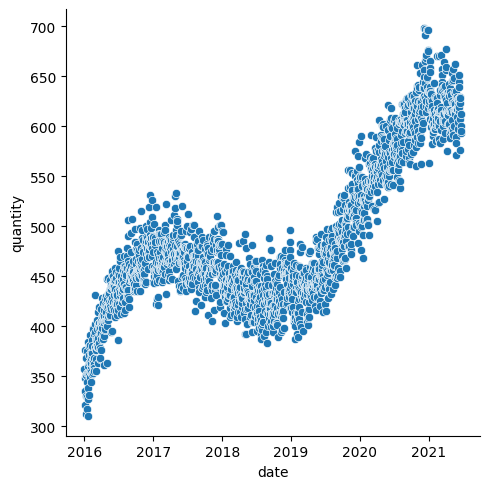

In [13]:
# visualizzazione dell'andamento delle vendite per data
# tramite [relplot] di Seaborn
plt.figure(figsize=(14, 6))
sns.relplot(x='date', y='quantity', data=df_grafici_sum)
plt.show()

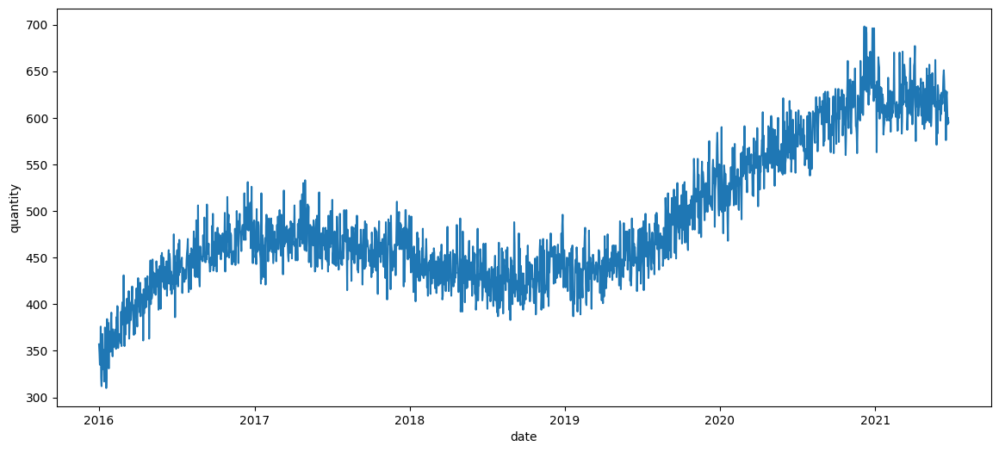

In [14]:
# visualizzazione dell'andamento delle vendite per data
# tramite [lineplot] di Seaborn
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_grafici_sum, x='date', y='quantity')
plt.show()


### Come vende lo store nei vari giorni della settimana?

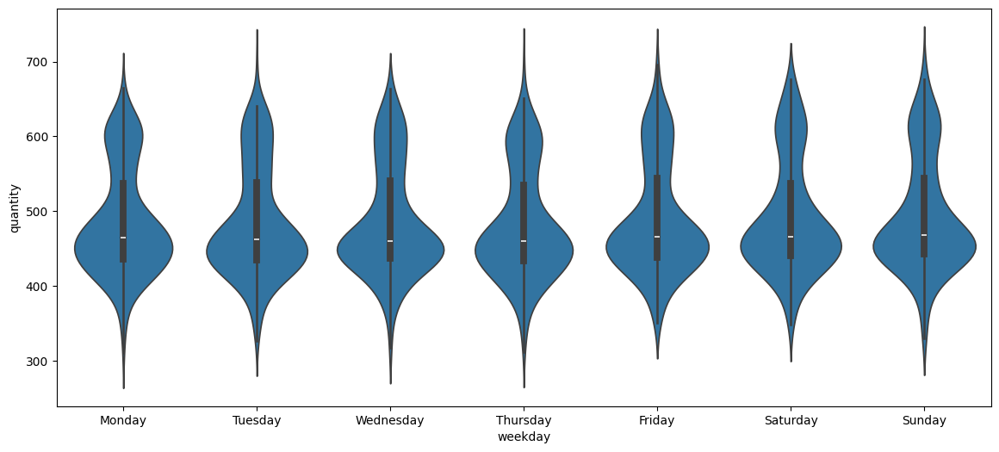

In [15]:
# utilizziamo i Violin-Plot di Seaborn per visualizzare
# la distribuzione delle vendite per giorno della settimana
plt.figure(figsize=(14, 6))
sns.violinplot(x='weekday', y='quantity', data=df_grafici_sum.sort_values('weekday_number'))
plt.show()

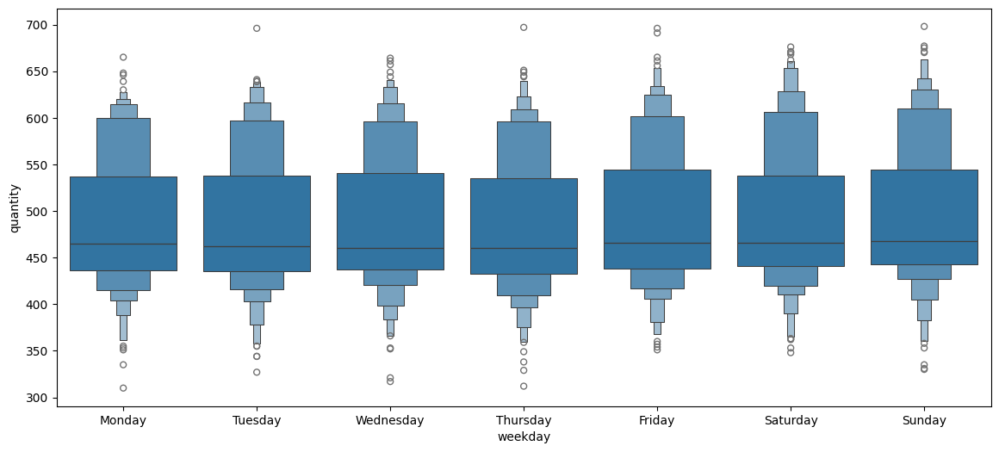

In [16]:
# utilizziamo i BoxenPlot di Seaborn per visualizzare
# la distribuzione delle vendite per giorno della settimana
# (rispetto ai ViolinPlot abbiamo più evidenza dei percentili
# in quanto il grafico inizia con la mediana (Q2, 50° percentile)
# come linea centrale. Ogni livello successivo verso l'esterno
# conterrà la metà dei dati rimanenti; quindi le prime due sezioni
# fuori dalla linea centrale contengono il 50% dei dati,
# le due sezioni successive contengono il 25% dei dati e si continua
# così finchè non si arriva a tracciare gli outlier, calcolati in
# modo da averne fino a 5-8 su ogni lato.
plt.figure(figsize=(14, 6))


sns.boxenplot(x='weekday', y='quantity', data=df_grafici_sum.sort_values('weekday_number')  )
plt.show()

### Come vende lo store nei vari giorni del mese e come?

<Figure size 1400x600 with 0 Axes>

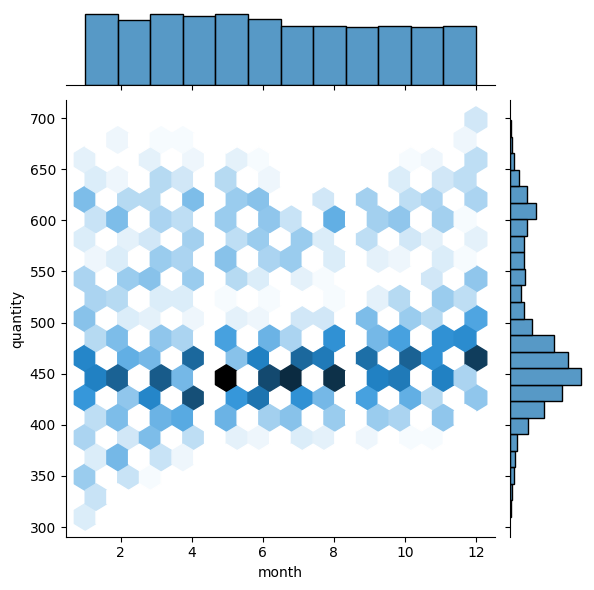

In [17]:
# sfruttiamo il JointPlot di Seaborn per evidenziare
# eventuali correlazioni tra le quantità vendute e
# i giorni del mese, cercando evidenza nei dati di
# giorni del mese in cui si vende di più o di meno,
# magari coincidenti a particolari eventi con
# ricorrenza mensile

# la tipologia di grafico usata [hex] visualizza degli
# esagoni di intensità di colore diverso, dipendenti
# dal numero di occorrenze nel dataset della coppia
# quantità / giorno del mese

plt.figure(figsize=(14, 6))
sns.jointplot(x='month', y='quantity', kind="hex", data=df_grafici_sum)
plt.show()

### Confrontiamo i vari anni tra di loro

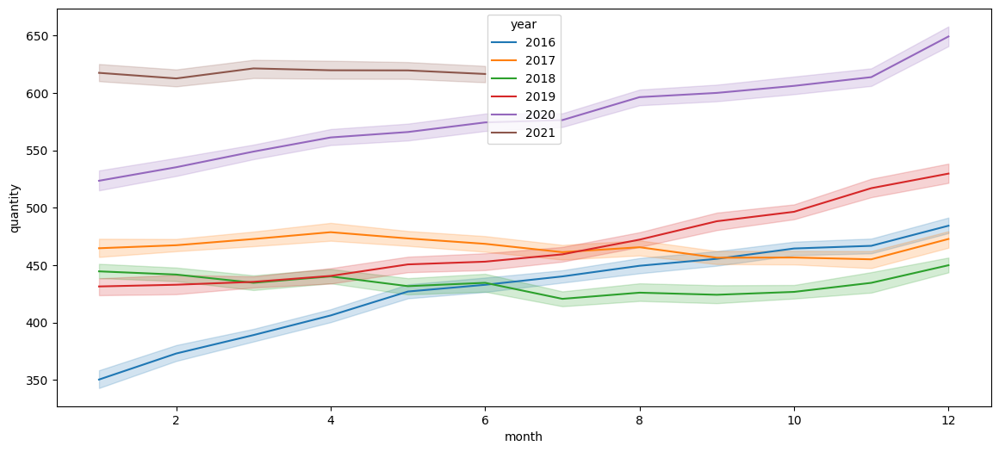

In [18]:
# sfruttiamo il parametro [hue] di un grafico di tipo
# LinePlot per evidenziare il diverso andamento delle
# vendite per mese, tra gli anni presenti nel dataset
# rappresentato dal dataframe [df_grafici_sum]

plt.figure(figsize=(14, 6))
sns.lineplot(data=df_grafici_sum, x='month', hue='year', y='quantity')
plt.show()

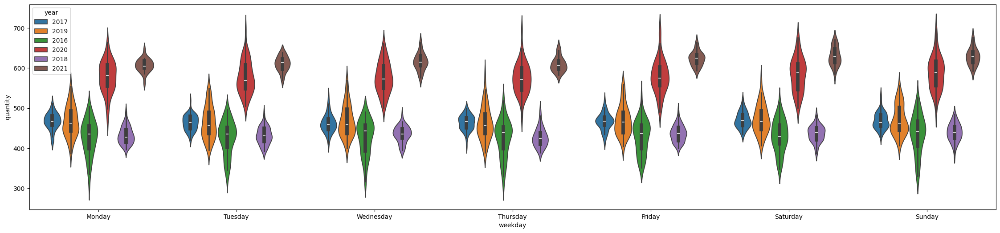

In [19]:
# visualizzazione dell'andamento delle vendite per
# giorno della settimana nei diversi anni

plt.figure(figsize=(28, 6))
sns.violinplot(x='weekday', y='quantity', hue='year', data=df_grafici_sum.sort_values('weekday_number'))
plt.show()

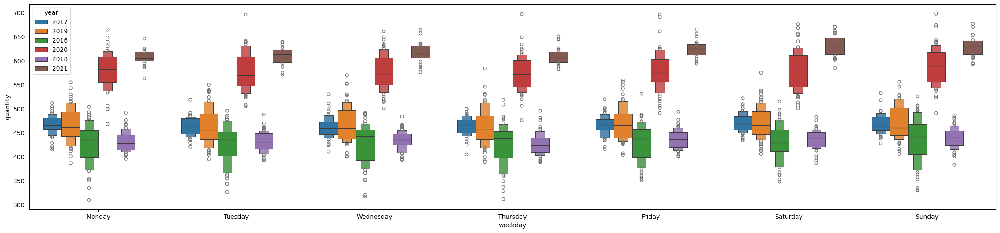

In [20]:
# come per la cella precedente, ma utilizzando i
# BoxenPlot di Seaborn

plt.figure(figsize=(28, 6))
sns.boxenplot(x='weekday', y='quantity', hue='year', data=df_grafici_sum.sort_values('weekday_number'))
plt.show()

<Figure size 1400x600 with 0 Axes>

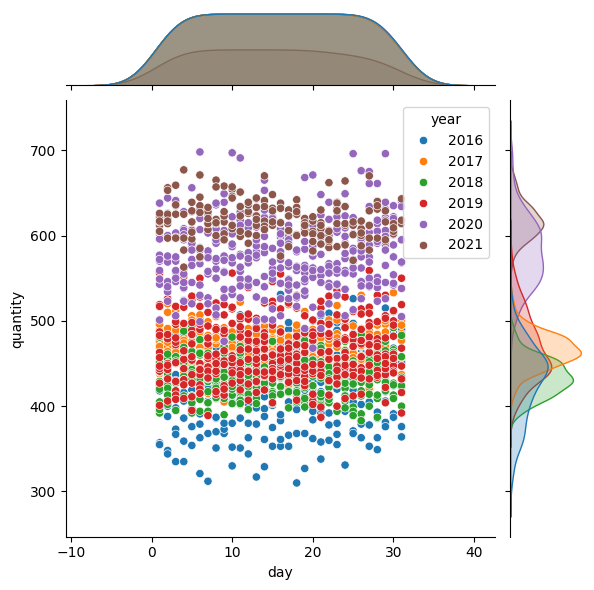

In [21]:
# utilizzo di un JointPlot per evidenziare eventuali
# correlazioni tra le quantità vendute e i giorni di
# un mese, visualizzando gli anni considerati tramite
# diversi colori
plt.figure(figsize=(14, 6))
sns.jointplot(x='day', y='quantity', hue='year', data=df_grafici_sum)
plt.show()


### Quali sono le categorie che vendono di più?

Procediamo con l'analisi dei dati disponibili, esplorandoli confrontando le
categorie disponibili.

In [22]:
categorie_più_vendute = df_grafici.groupby('category')['quantity'].agg('sum').reset_index().sort_values(
    'quantity',
    ascending=False
)

categorie_più_vendute

,category,quantity
0,abbigliamento,132389
2,cancelleria,124884
9,smartphone,123998
4,cucina,123368
6,libri,111888
5,giardinaggio,103728
3,cosmetici,90997
8,scarpe,58087
7,notebook,57387
1,borse,48264


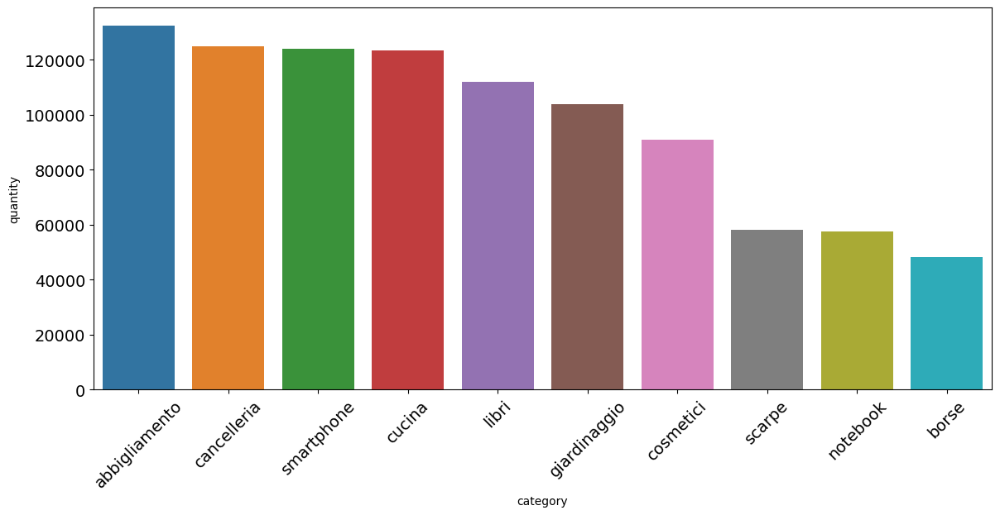

In [23]:
# visualizziamo il dataframe appena creato
# tramite un grafico a barre

plt.figure(figsize=(14, 6))
sns.barplot(x='category', y='quantity', data=categorie_più_vendute,  hue='category', palette="tab10", legend=False )
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

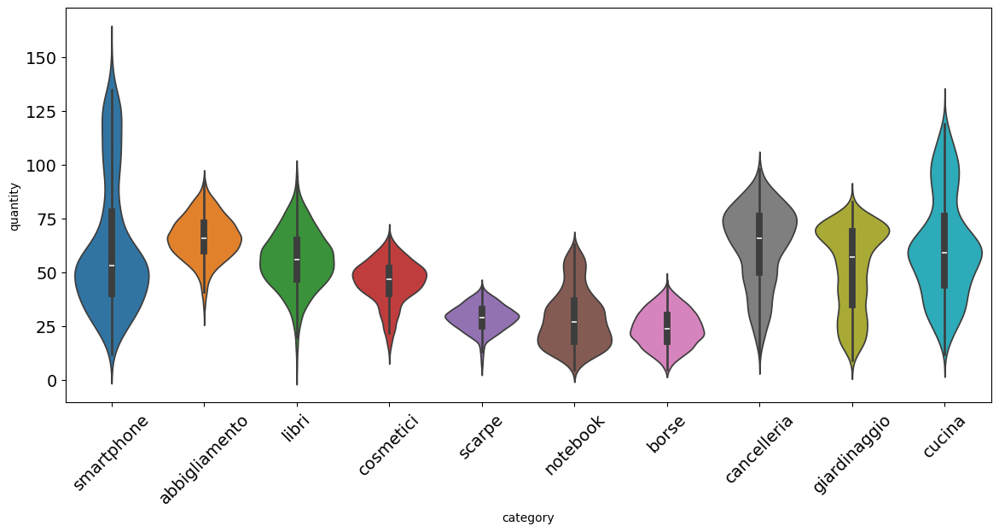

In [24]:
# analizziamo la distribuzione delle quantità
# vendute per categoria tramite i grafici a violino

plt.figure(figsize=(14, 6))
sns.violinplot(x='category', y='quantity', data=df_grafici, hue='category', palette="tab10", legend=False )
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

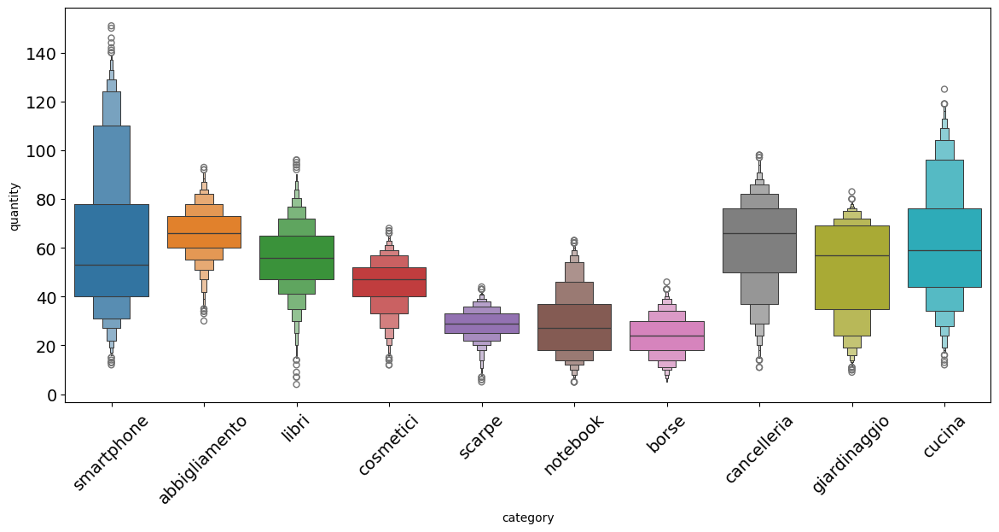

In [25]:
# ...e con un BoxenPlot

plt.figure(figsize=(14, 6))
sns.boxenplot(x='category', y='quantity', data=df_grafici, hue='category', palette="tab10", legend=False)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

<Figure size 2000x2000 with 0 Axes>

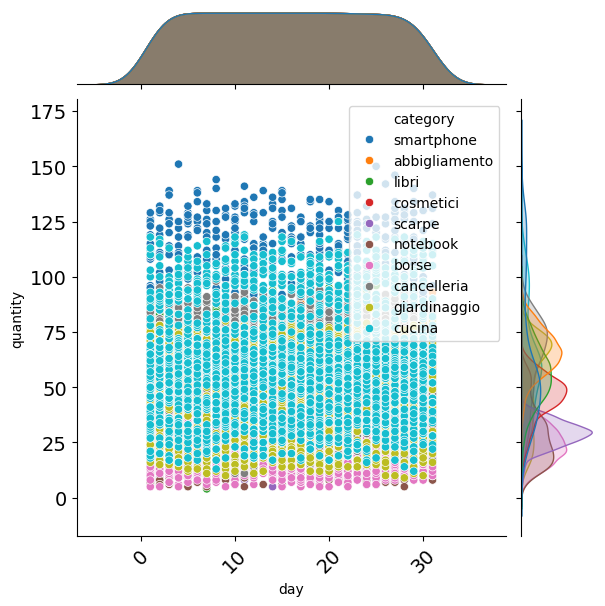

In [26]:
# analizziamo eventuali correlazioni tra
# le quantità vendute per categoria e i
# giorni del mese

plt.figure(figsize=(20, 20))
sns.jointplot(x='day', y='quantity', hue='category', data=df_grafici)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### Visualizziamo le vendite giorno per giorno delle varie categorie

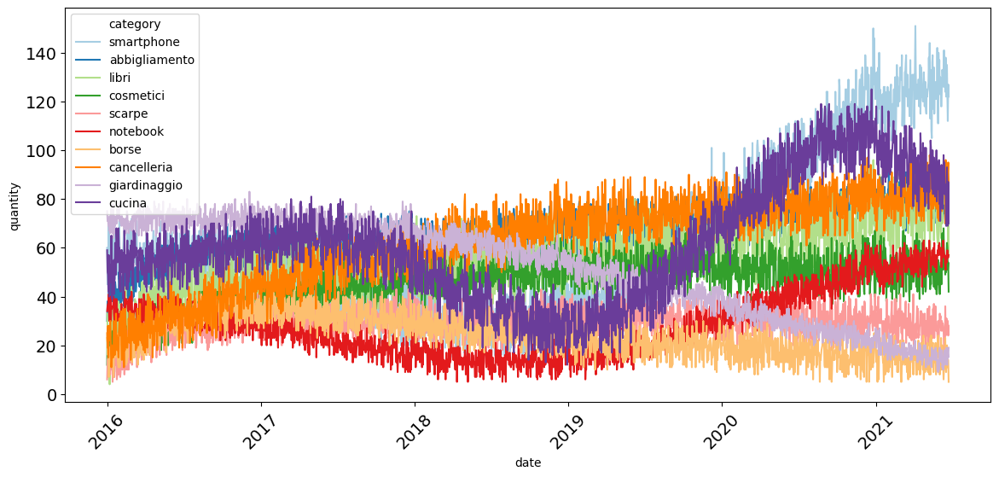

In [27]:
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_grafici, x='date', y='quantity', hue='category', palette='Paired')
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### Visualizziamo le vendite giorno per giorno delle varie categorie per un mese
Selezionare come periodo campione giugno e luglio 2018

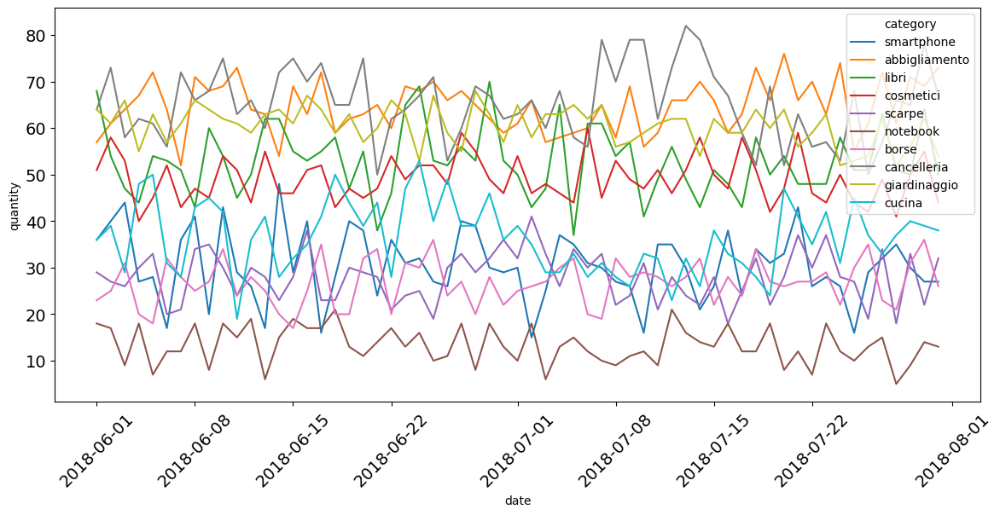

In [28]:
plt.figure(figsize=(14, 6))
sns.lineplot(

    data=df_grafici[(df_grafici['date'] >= '2018-06-01') & (df_grafici['date'] <= '2018-07-31')],
    x="date",
    y="quantity",
    hue="category"
)

plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### In quale mese vendiamo di più?

In [29]:

mesi_migliori = df_grafici.groupby(['month','month_number'])['quantity'].sum().reset_index().sort_values('month_number')
mesi_migliori[['month',	'quantity']]

,month,quantity
4,January,87793
3,February,81072
7,March,89968
0,April,88401
8,May,92016
6,June,84466
5,July,73092
1,August,74698
11,September,72732
10,October,75965


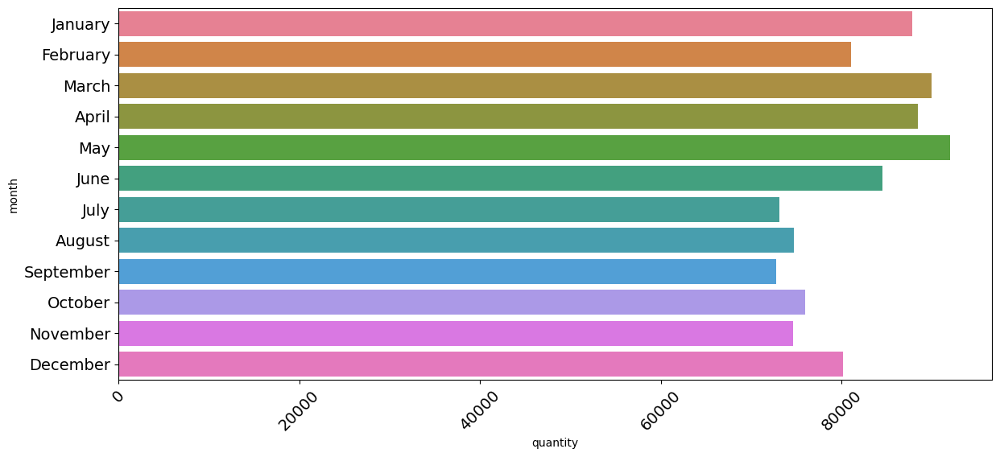

In [30]:
# visualizzazione su grafico a barre orizzontale

plt.figure(figsize=(14, 6))
sns.barplot(y='month', x='quantity', data=mesi_migliori, hue ='month' , orientation='horizontal', legend = False )
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### In quale giorno della settimana vendiamo di più?

In [31]:
# raggruppare [df_grafici] per le colonne relative ai giorni della settimana, sommare le quantità e
# ordinare in ordine crescente il dataset risultante, tutto in una riga di codice:

giorni_migliori = df_grafici.groupby(['weekday','weekday_number'])['quantity'].sum().reset_index().sort_values('weekday_number')
giorni_migliori[['weekday',	'quantity']]

,weekday,quantity
1,Monday,138917
5,Tuesday,138501
6,Wednesday,138489
4,Thursday,137484
0,Friday,139844
2,Saturday,140642
3,Sunday,141113


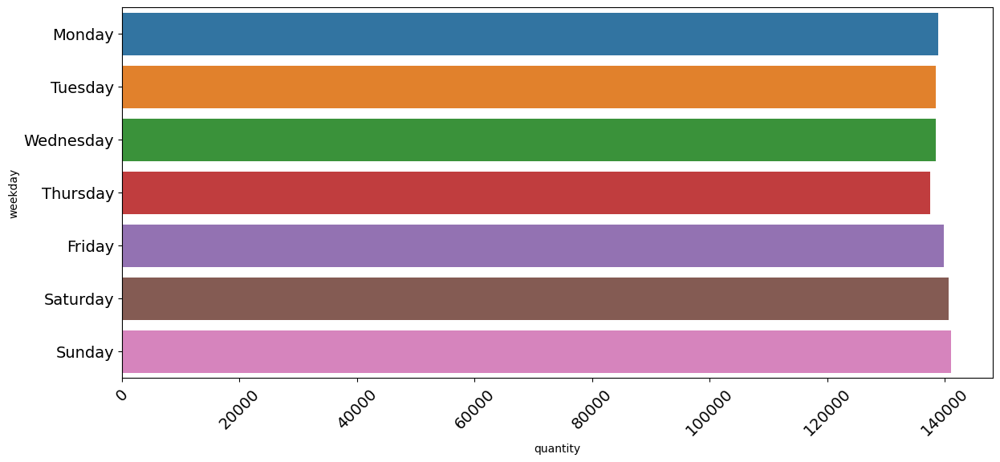

In [32]:
# visualizzazione delle quantità vendute per giorno della settimana
# su un grafico a barre orizzontale

plt.figure(figsize=(14, 6))
sns.barplot(y='weekday', x='quantity', data=giorni_migliori, hue ='weekday' , orientation='horizontal', legend = False)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()

### In quale anno abbiamo venduto di più?

In [33]:
anni_migliori = df_grafici.groupby(df_grafici['date'].dt.strftime('%Y'))['quantity'].sum().reset_index().sort_values('date')
anni_migliori

,date,quantity
0,2016,156792
1,2017,170122
2,2018,158421
3,2019,170619
4,2020,212093
5,2021,106943


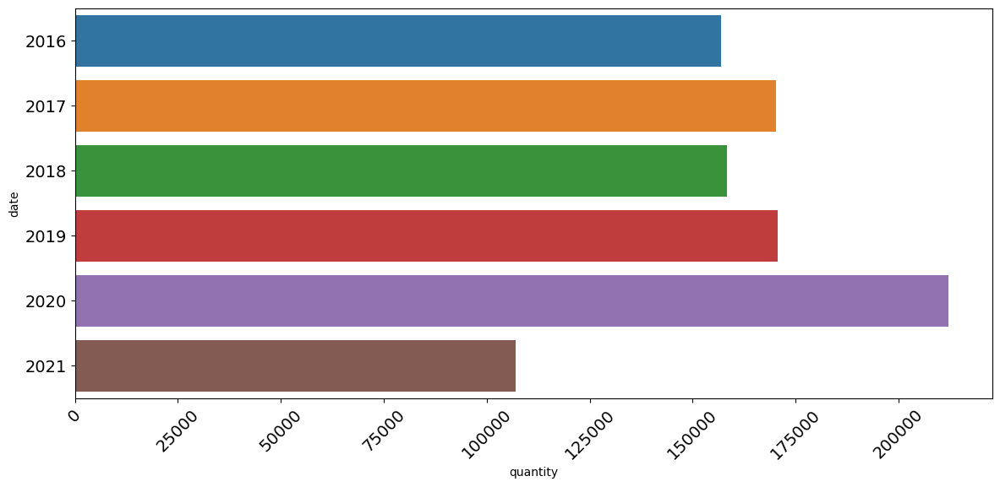

In [34]:
# grafico a barre orizzontale delle quantità vendute per anno
# (si può notare l'aumento delle vendite durante la pandemia,
# da notare che i dati del 2021 si fermano a giugno,
# potenzialmente il 2021 dovrebbe chiudersi come o meglio
# del 2020)

plt.figure(figsize=(14, 6))
sns.barplot(y='date', x='quantity', data=anni_migliori, hue ='date' , orientation='horizontal', legend = False)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.show()


### Visualizziamo i grafici per le singole categorie

In [35]:
df_grafici

,date,category,quantity,day,year,month_number,month,weekday,weekday_number
0,2016-01-01,smartphone,60,1,2016,1,January,Friday,4
1,2016-01-02,smartphone,45,2,2016,1,January,Saturday,5
2,2016-01-03,smartphone,51,3,2016,1,January,Sunday,6
3,2016-01-04,smartphone,57,4,2016,1,January,Monday,0
4,2016-01-05,smartphone,71,5,2016,1,January,Tuesday,1
...,...,...,...,...,...,...,...,...,...
19995,2021-06-18,cucina,93,18,2021,6,June,Friday,4
19996,2021-06-19,cucina,84,19,2021,6,June,Saturday,5
19997,2021-06-20,cucina,69,20,2021,6,June,Sunday,6
19998,2021-06-21,cucina,87,21,2021,6,June,Monday,0


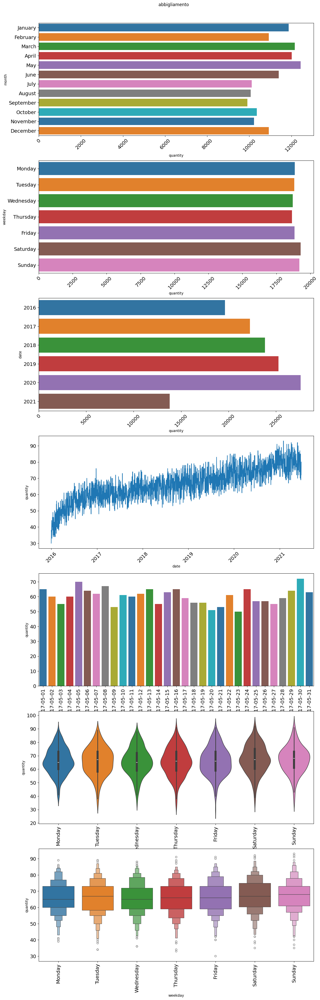

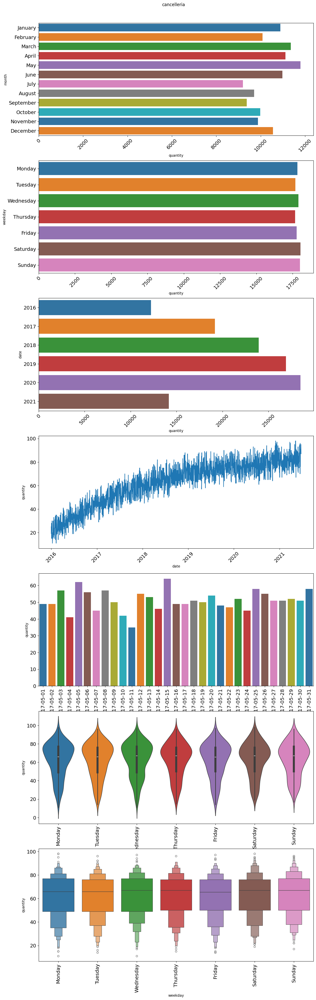

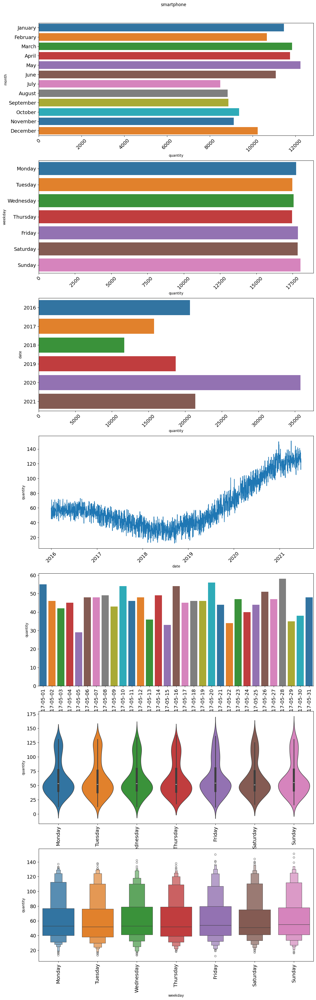

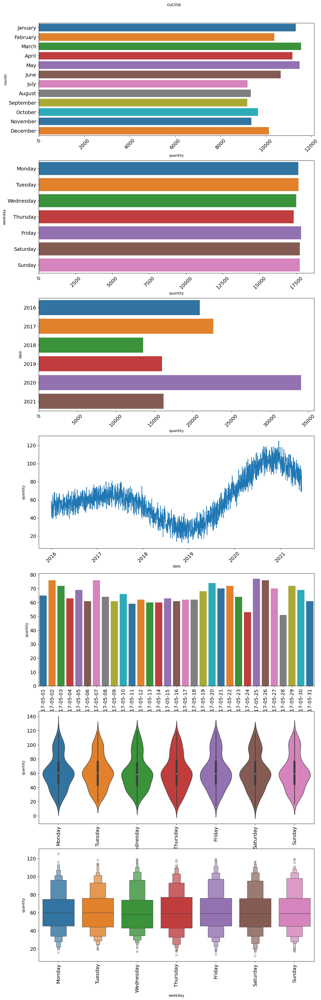

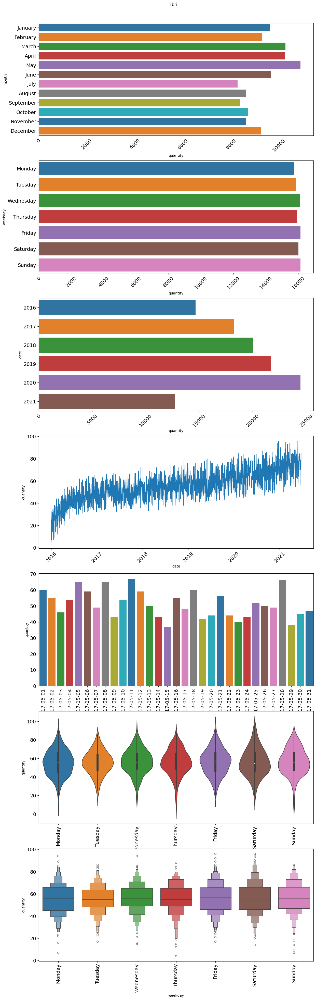

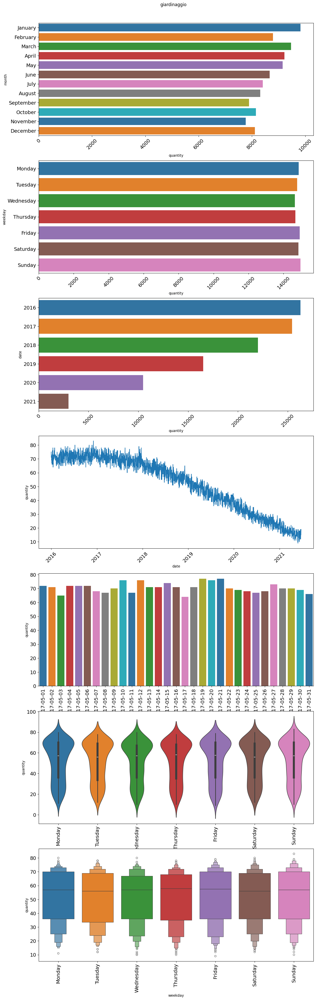

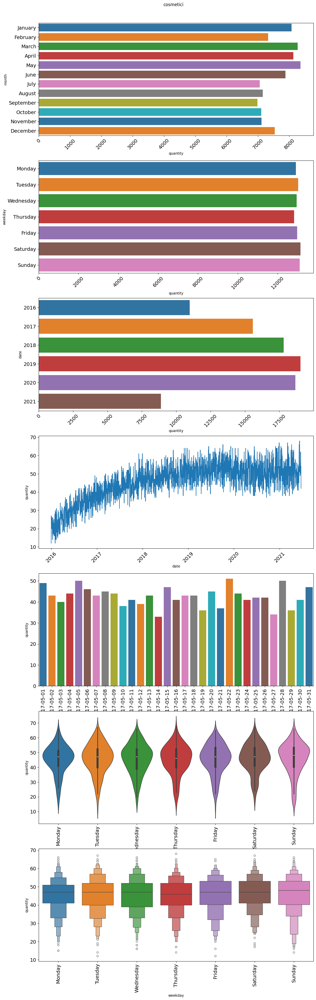

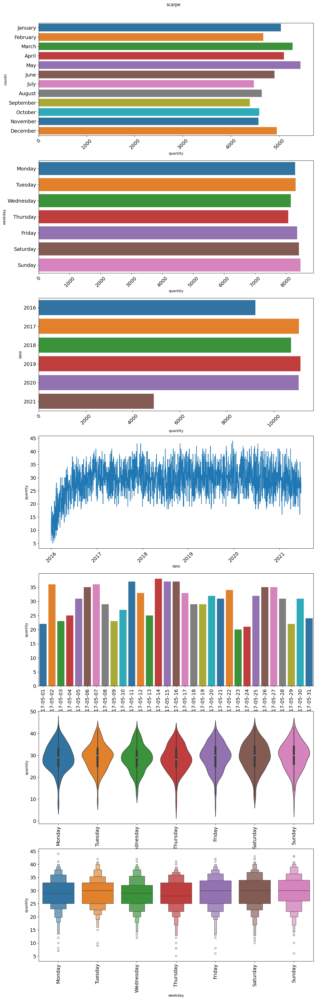

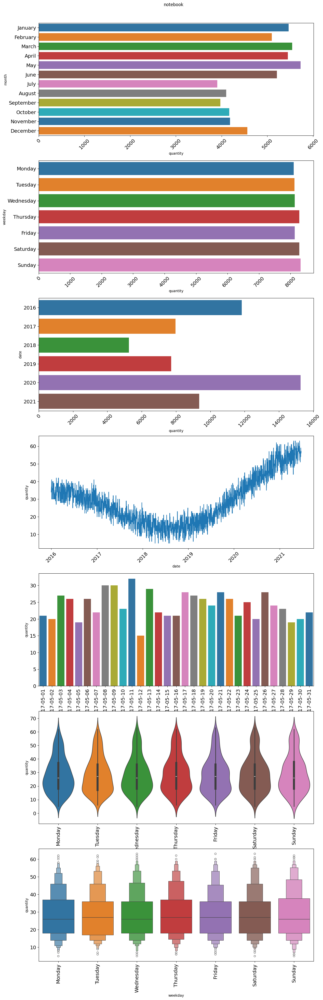

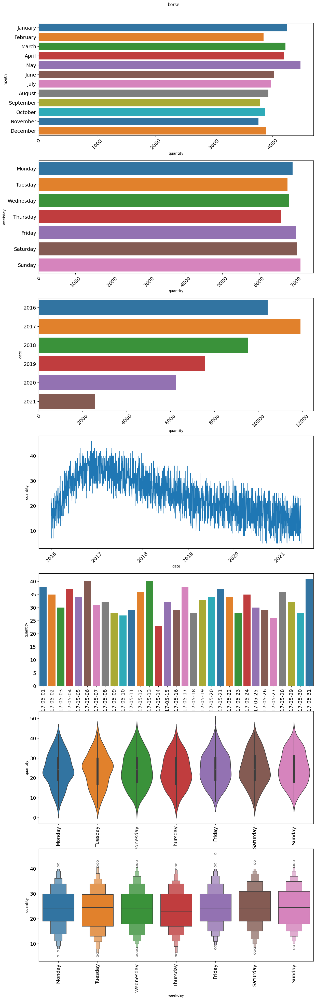

In [54]:
# implementazione di un ciclo per visualizzare dei grafici
# riepilogativi di quanto analizzato fin'ora per ogni
# categoria disponibile, sfruttando il dataframe
# [df_grafici] creato precedentemente e filtrato su
# una particolare categoria in ogni ciclo

for categoria in categorie_più_vendute['category'].unique():
    df_categoria = df_grafici[df_grafici.category == categoria]
    
    # creazione di un grafico multiplo composto da
    # 7 sotto-grafici, disposti verticalmente
    fig, (ax1, ax2, ax3, ax4, ax5, ax6, ax7) = plt.subplots(nrows=7, ncols=1, figsize=(14, 40))
    fig.tight_layout(pad=10, w_pad=0.5, h_pad=5)
    fig.suptitle(f'{categoria}')
    fig.subplots_adjust(top=0.96)

    mesi_migliori = df_categoria.groupby(['month','month_number'])['quantity'].sum().reset_index().sort_values('month_number')

    sns.barplot(y='month', x='quantity', data=mesi_migliori, palette="tab10", hue = 'month', orientation='horizontal', ax=ax1)
    ax1.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax1.tick_params(axis='y', labelsize=14)

    giorni_migliori = df_categoria.groupby(['weekday','weekday_number'])['quantity'].sum().reset_index().sort_values('weekday_number')

    sns.barplot(y='weekday', x='quantity', data=giorni_migliori, palette="tab10", hue = 'weekday', orientation='horizontal', ax=ax2)
    ax2.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax2.tick_params(axis='y', labelsize=14)

    anni_migliori = df_categoria.groupby(df_categoria['date'].dt.strftime('%Y'))['quantity'].sum().reset_index().sort_values('date')

    sns.barplot(y='date', x='quantity', data=anni_migliori, palette="tab10", hue = 'date',  orientation='horizontal', ax=ax3)
    ax3.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax3.tick_params(axis='y', labelsize=14)

    sns.lineplot(data=df_categoria, x="date", y="quantity",  ax=ax4)
    ax4.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax4.tick_params(axis='y', labelsize=14)

    df_categoria_singolo_mese = df_categoria[(df_categoria.date.dt.year == 2017) & (df_categoria.date.dt.month == 5)].copy()
    df_categoria_singolo_mese.date = df_categoria_singolo_mese.date.dt.date
    sns.barplot(data=df_categoria_singolo_mese, x="date", y="quantity", palette="tab10", hue ='date', legend=False,  ax=ax5)
    ax5.tick_params(axis='x', labelrotation=90, labelsize=14)
    ax5.tick_params(axis='y', labelsize=14)

    sns.violinplot(x="weekday", y="quantity", data=df_categoria.sort_values('weekday_number'), palette="tab10", hue = 'weekday', legend=False,  ax=ax6)
    ax6.tick_params(axis='x', labelrotation=90, labelsize=14)
    ax6.tick_params(axis='y', labelsize=14)

    sns.boxenplot(x="weekday", y="quantity", data=df_categoria.sort_values('weekday_number'), palette="tab10", hue = 'weekday', legend=False,  ax=ax7)
    ax7.tick_params(axis='x', labelrotation=90, labelsize=14)
    ax7.tick_params(axis='y', labelsize=14)

    plt.show()

    print('\n\n\n\n')

### Analisi della correlazione tra categorie

<Axes: >

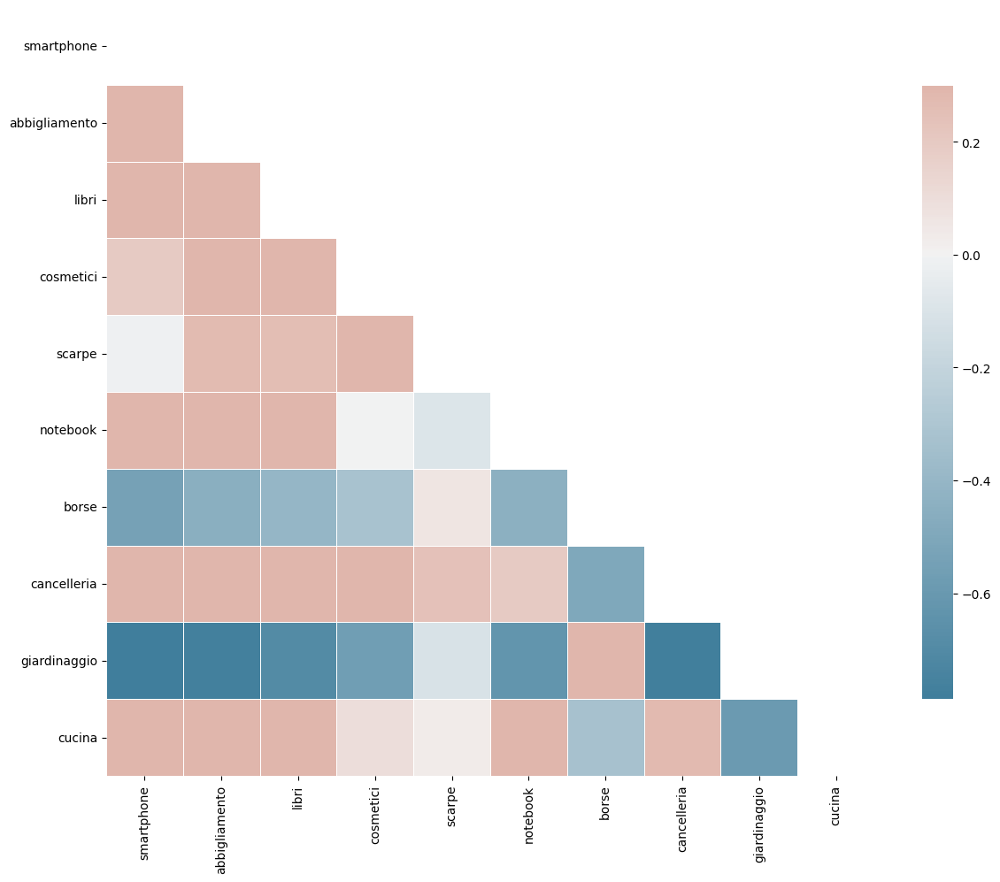

In [56]:
# calcolo della mappa di correlazione tramite Pandas
corr = df.corr()

# generazione di una maschera per il triangolo superiore
# tramite np.triu di NumPy
mask = np.triu(np.ones_like(corr, dtype=bool))


f, ax = plt.subplots(figsize=(14, 18))

# creazione di una mappa colori custom
# tra due colori in formato HUSL che permette
# un buon bilanciamento tra i colori associati
# agli estremi (nel ns caso -1 e 1) e la
# sfumatura di colore per arrivare al bianco
# centrale (nel ns caso corrispondente al valore
# zero)
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# visualizzazione della mappa di correlazione,
# sfruttando la maschera e la mappa di colori
# appena create
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})


### Verifichiamo che non ci siano date mancanti nel nostro dataset

In [57]:
inizio = min(df.index)
fine = max(df.index)
intervallo_di_date = pd.date_range(inizio, fine, freq='D').tolist()

In [58]:
set_date_in_df = set(df.index.to_list())
set_intervallo_di_date = set(intervallo_di_date)
check = all(item in set_intervallo_di_date for item in set_date_in_df)

print('ci sono tutte le date nel dataset?', 'Si' if check else 'No')

# verificare se esistono date duplicate
print('le date presenti nel dataset sono uniche?', 'Si' if check else 'No')

ci sono tutte le date nel dataset? Si
le date presenti nel dataset sono uniche? Si


## Data-Augmentation

creazione di nuove feature / informazioni per arricchire il dataset e
permettere un addestramento migliore del modello.

Durante la precedente analisi si sono evidenziati comportamenti differenti,
relativamente alle vendite, in alcuni precisi periodi dell'anno che
corrispondono alle festività. Oltre queste ci si è spiegati un incremento
delle vendite intorno a fine novembre con la festività americana del
"black friday", ormai sbarcata abbondantemente anche in Europa e in Italia.

### Aggiungiamo le festività al dataset

In [59]:
calendario = Italy()
calendario_usa = California()

festivita = []
black_friday = []
anni = df.index.year.unique().to_list()
anni.sort()

for anno in anni:
    for holiday in calendario.holidays(anno):
        festivita.append(holiday[0]) # in holiday[0] è presente la data dell'evento
                                     # la libreria workalendar restituisce, per ogni
                                     # evento che conosce, una tupla contenente la
                                     # data dell'evento in formato datetime e il nome
                                     # dell'evento in formato stringa nella seconda
                                     # posizione della tupla

    for holiday in calendario_usa.holidays(anno):
        if holiday[1] == 'Thanksgiving Friday':
            festivita.append(holiday[0])
            black_friday.append(holiday[0])

# creazione di una colonna [holidays] di tipo booleano con tutti valori False
df['holidays'] = False

# assegnazione del valore della colonna [holidays] a True
# per tutte le date presenti nella lista [festività]
df.loc[df.index.isin(festivita), 'holidays'] = True

/tmp/ipykernel_24081/3094011923.py:28: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  df.loc[df.index.isin(festivita), 'holidays'] = True


## Aggiungiamo i prefestivi al dataset

In [60]:
df['pre_holidays'] = df['holidays'].shift(-1)
df.dropna(inplace=True)

### Controlliamo che tutto sia corretto

In [61]:
print(df.loc[(df.index.day == 24) & (df.index.month == 12), ['holidays', 'pre_holidays']])

            holidays pre_holidays
date                             
2016-12-24     False         True
2017-12-24     False         True
2018-12-24     False         True
2019-12-24     False         True
2020-12-24     False         True


In [62]:
print(df.loc[(df.index.day == 25) & (df.index.month == 12), ['holidays', 'pre_holidays']])

            holidays pre_holidays
date                             
2016-12-25      True         True
2017-12-25      True         True
2018-12-25      True         True
2019-12-25      True         True
2020-12-25      True         True


In [63]:
print(df.loc[(df.index.day == 26) & (df.index.month == 12), ['holidays', 'pre_holidays']])

            holidays pre_holidays
date                             
2016-12-26      True        False
2017-12-26      True        False
2018-12-26      True        False
2019-12-26      True        False
2020-12-26      True        False


### Rapporto vendite giornaliere rispetto ai giorni feriali, prefestivi e festivi

#### Le informazioni aggiunte aggiungono effettivamente informazioni al dataset?

In [64]:
nessuna_festivita = df[(df.holidays == False) & (df.pre_holidays == False)]
festivi = df[(df.holidays == True)]
prefestivi = df[(df.holidays == False) & (df.pre_holidays == True)]

media_festivi = (festivi.sum() / len(festivi))
media_prefestivi = (prefestivi.sum() / len(prefestivi))
media_nessuna_festivita = (nessuna_festivita.sum() / len(nessuna_festivita))



### Quanto vendiamo mediamente nei giorni festivi, pre festivi e nei giorni lavorativi?

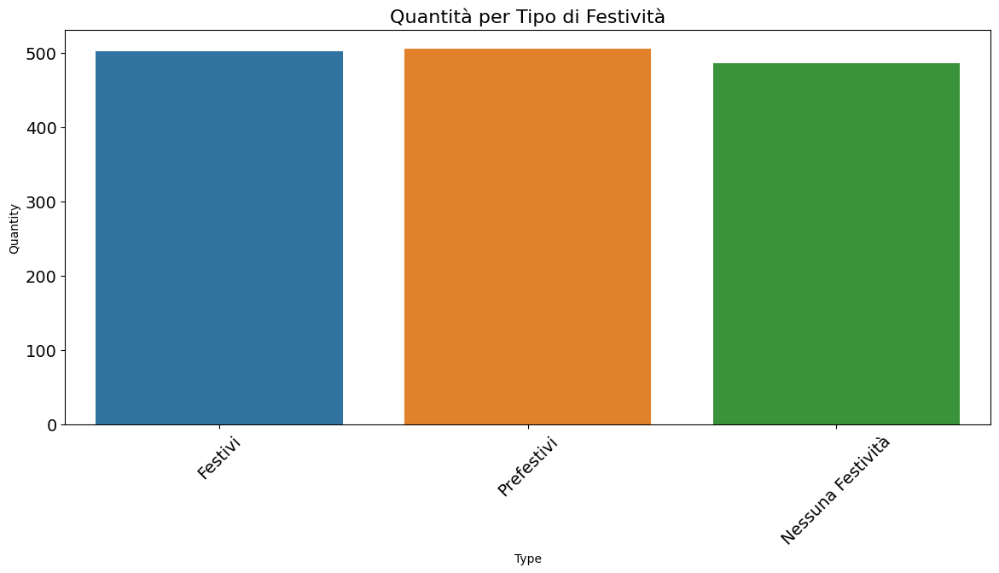

In [65]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Supponendo che 'media_festivi', 'media_prefestivi', 'media_nessuna_festivita' siano già definiti
values = [
    media_festivi.drop(['holidays', 'pre_holidays']).sum(),
    media_prefestivi.drop(['holidays', 'pre_holidays']).sum(),
    media_nessuna_festivita.drop(['holidays', 'pre_holidays']).sum(),
]

# Crea un DataFrame
data = pd.DataFrame({
    'Type': ['Festivi', 'Prefestivi', 'Nessuna Festività'],
    'Quantity': values
})

# Crea il grafico a barre
plt.figure(figsize=(14, 6))
sns.barplot(data=data, x='Type', y='Quantity',hue='Type', palette="tab10", legend=False)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.title('Quantità per Tipo di Festività', fontsize=16)
plt.show()


In [66]:
# creazione delle colonne [holidays] e [pre_holidays] nel dataframe [df_grafici]
df_grafici['holidays'] = False
df_grafici.loc[df_grafici.date.isin(festivita), 'holidays'] = True

df_grafici['pre_holidays'] = df_grafici['holidays'].shift(1)
df_grafici.dropna(inplace=True)

# creazione di una colonna contenente un testo che riporta la tipologia di
# giornata, se festiva, prefestiva o feriale
df_grafici['giorni'] = ''
df_grafici.loc[(df_grafici.holidays == False) & (df_grafici.pre_holidays == False), 'giorni'] = 'nessuna_festivita'
df_grafici.loc[(df_grafici.holidays == True), 'giorni'] = 'festivi'
df_grafici.loc[(df_grafici.holidays == False) & (df_grafici.pre_holidays == True), 'giorni'] = 'prefestivi'

/tmp/ipykernel_24081/28527184.py:3: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  df_grafici.loc[df_grafici.date.isin(festivita), 'holidays'] = True


In [67]:
# creazione delle colonne [holidays] e [pre_holidays] nel dataframe [df_grafici_sum]
df_grafici_sum['holidays'] = False
df_grafici_sum.loc[df_grafici_sum.index.isin(festivita), 'holidays'] = True

df_grafici_sum['pre_holidays'] = df_grafici_sum['holidays'].shift(1)
df_grafici_sum.dropna(inplace=True)

# creazione di una colonna contenente un testo che riporta la tipologia di
# giornata, se festiva, prefestiva o feriale
df_grafici_sum['giorni']=''
df_grafici_sum.loc[
    (df_grafici_sum.holidays == False) & (df_grafici_sum.pre_holidays == False), 'giorni'
] = 'nessuna_festivita'
df_grafici_sum.loc[(df_grafici_sum.holidays == True), 'giorni'] = 'festivi'
df_grafici_sum.loc[(df_grafici_sum.holidays == False) & (df_grafici_sum.pre_holidays == True), 'giorni'] = 'prefestivi'

/tmp/ipykernel_24081/3053765156.py:3: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  df_grafici_sum.loc[df_grafici_sum.index.isin(festivita), 'holidays'] = True


<Figure size 1400x600 with 0 Axes>

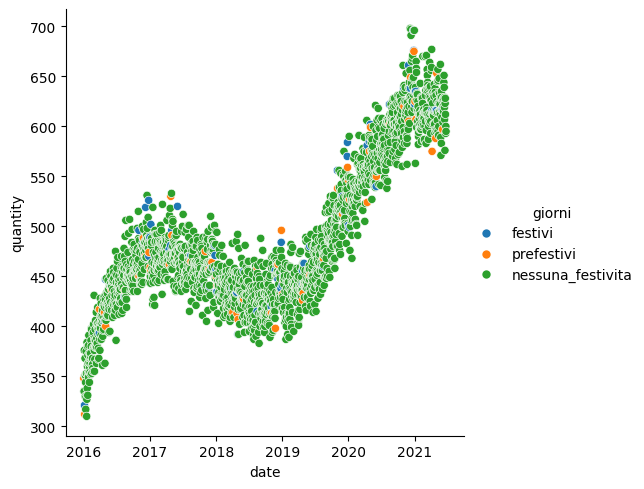

In [68]:
# visualizzazione delle vendite per data, evidenziando
# i giorni festivi, prefestivi e feriali

plt.figure(figsize=(14, 6))
sns.relplot(x='date', y='quantity', hue='giorni', data=df_grafici_sum, hue_order=['festivi', 'prefestivi', 'nessuna_festivita'])
plt.show()

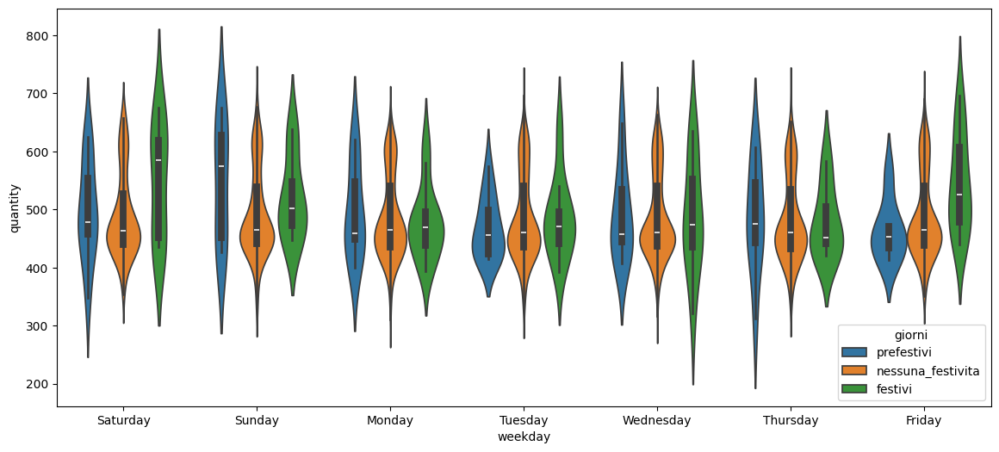

In [69]:
# visualizzazione delle vendite per giorno della settimana
# evidenziando i giorni festivi, prefestivi e feriali

plt.figure(figsize=(14, 6))
sns.violinplot(x='weekday', y='quantity', hue='giorni', data=df_grafici_sum)
plt.show()

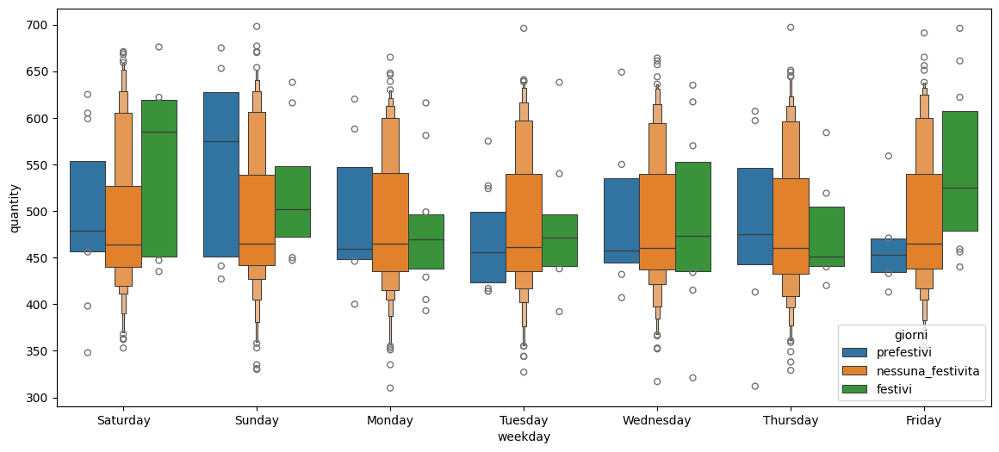

In [70]:
# come nella cella precedente, ma tramite BoxenPlot

plt.figure(figsize=(14, 6))
sns.boxenplot(x='weekday', y='quantity', hue='giorni', data=df_grafici_sum)
plt.show()

### Quanto vendiamo mediamente nei giorni festivi, pre festivi e nei giorni lavorativi per le singole categorie?

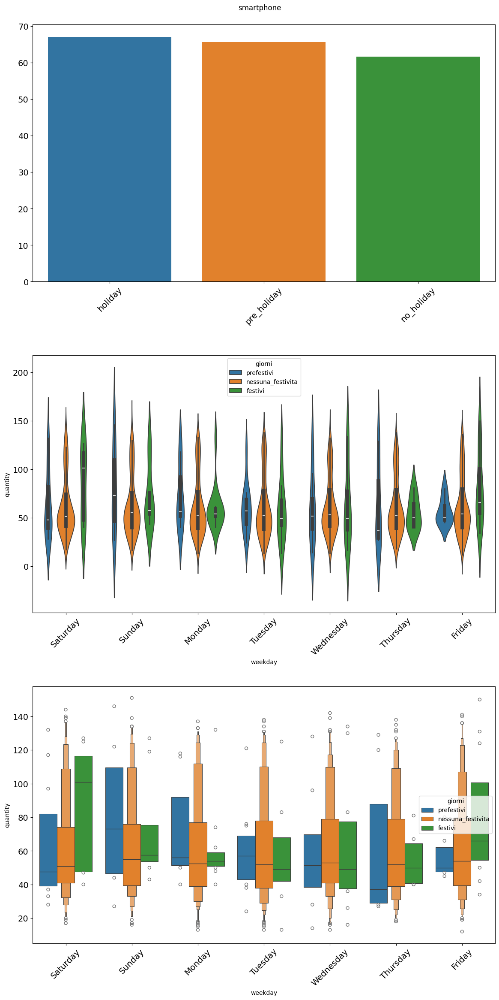

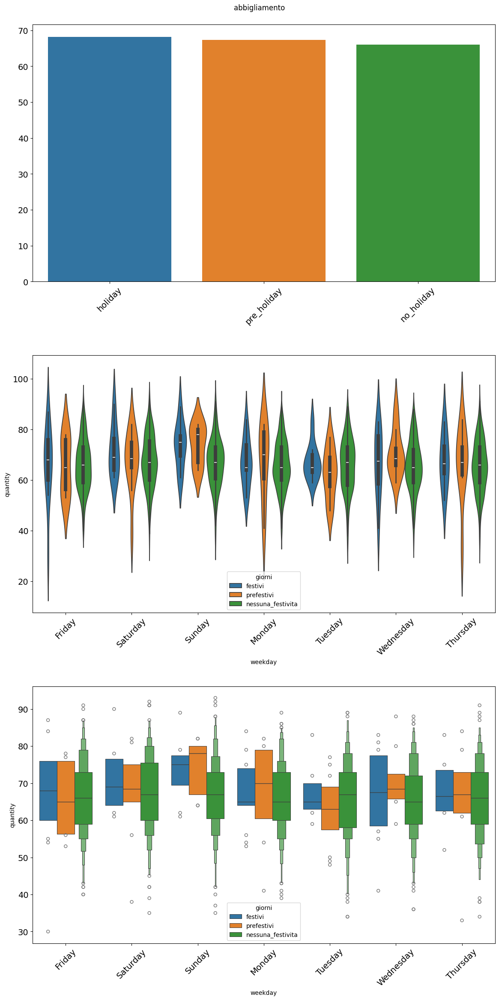

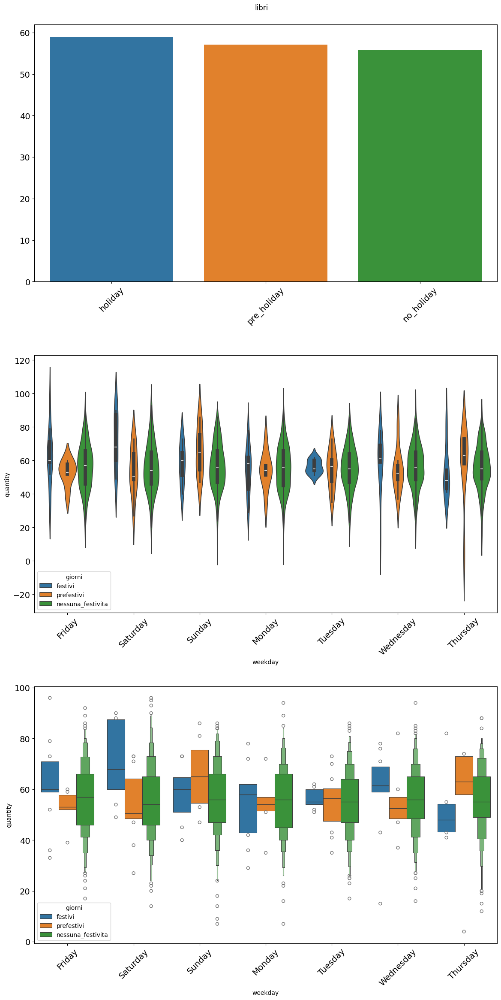

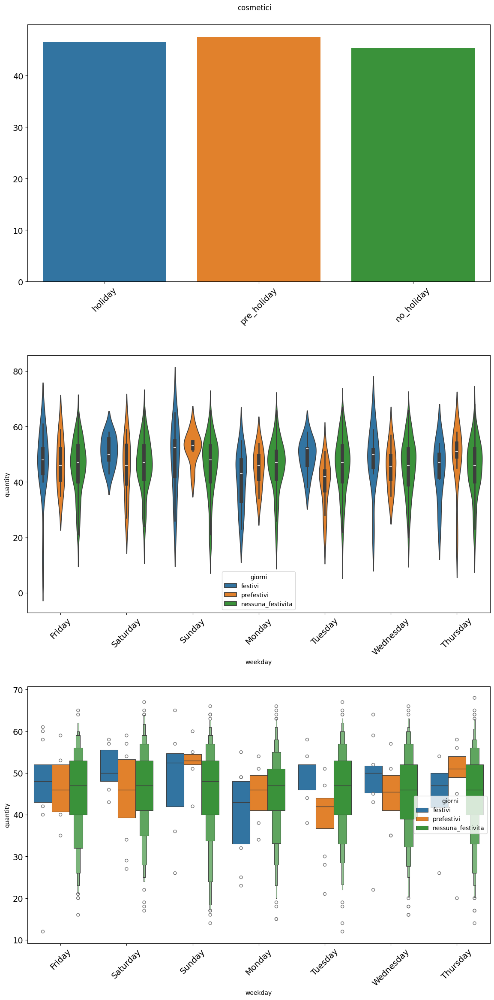

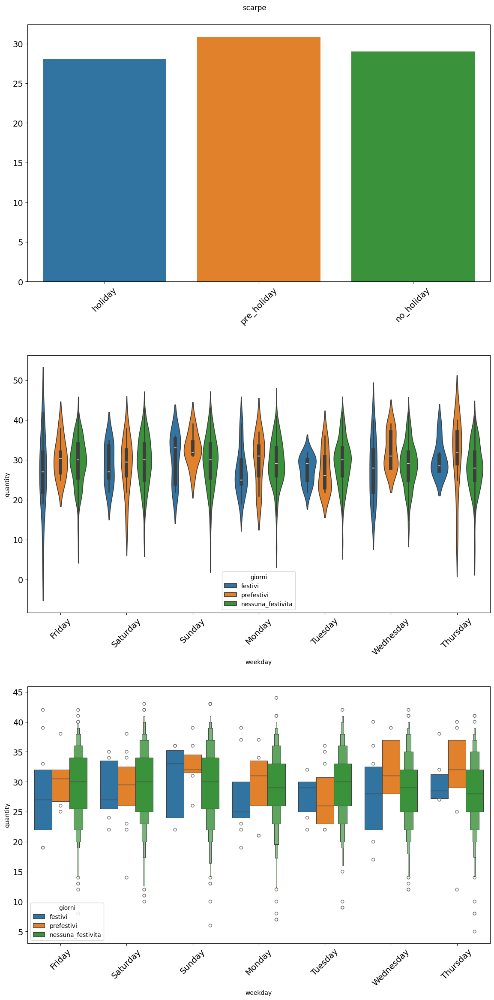

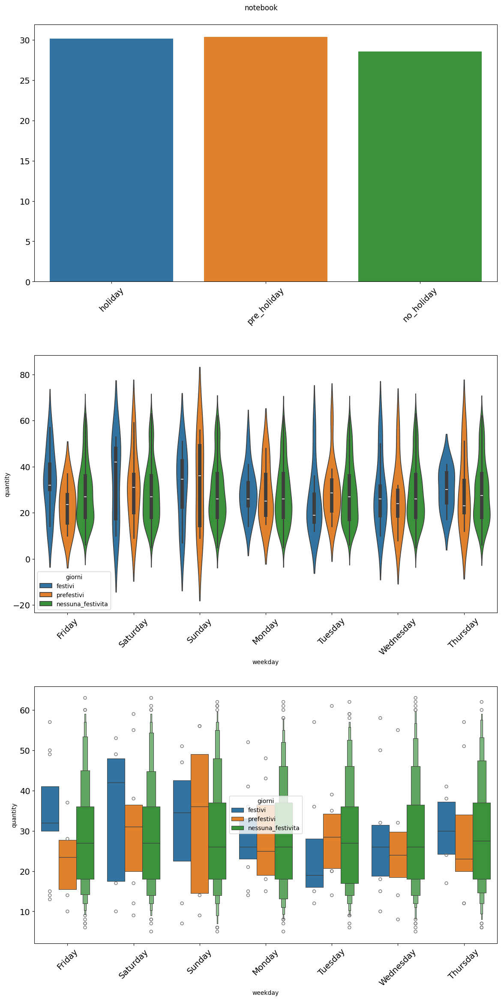

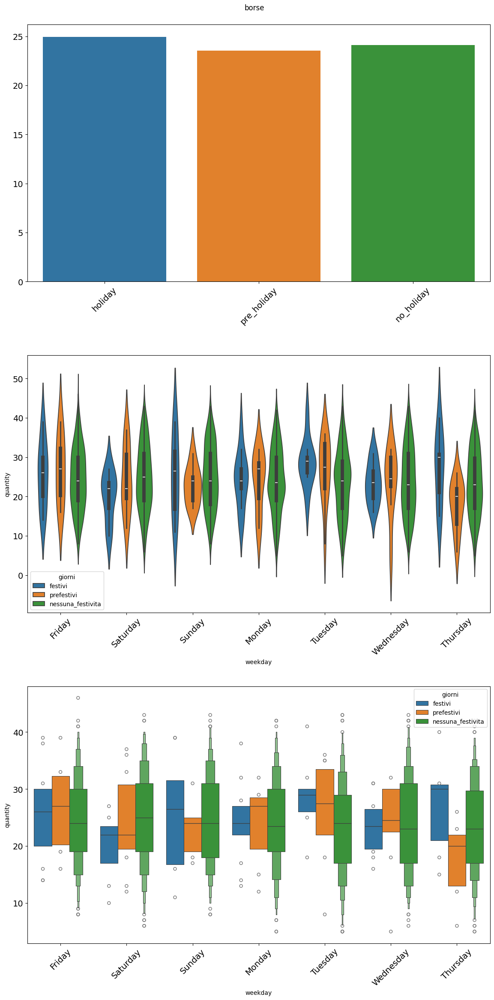

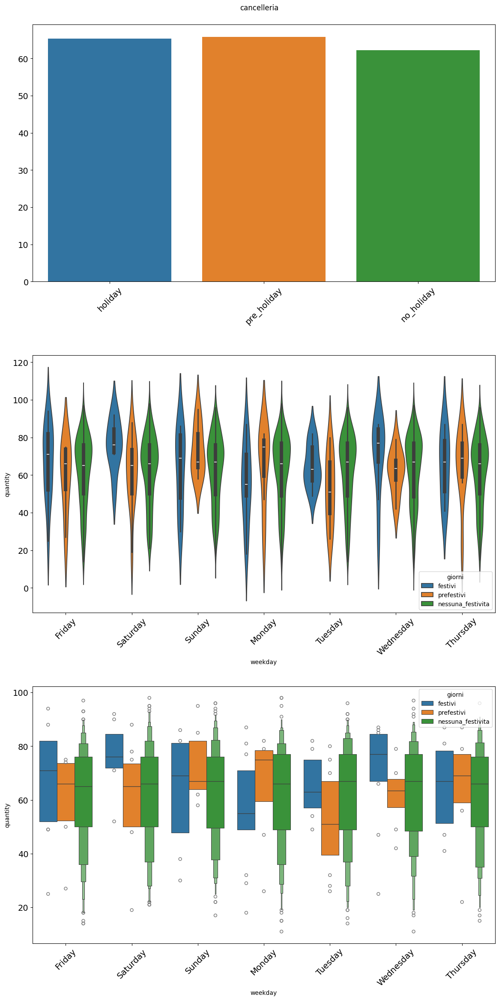

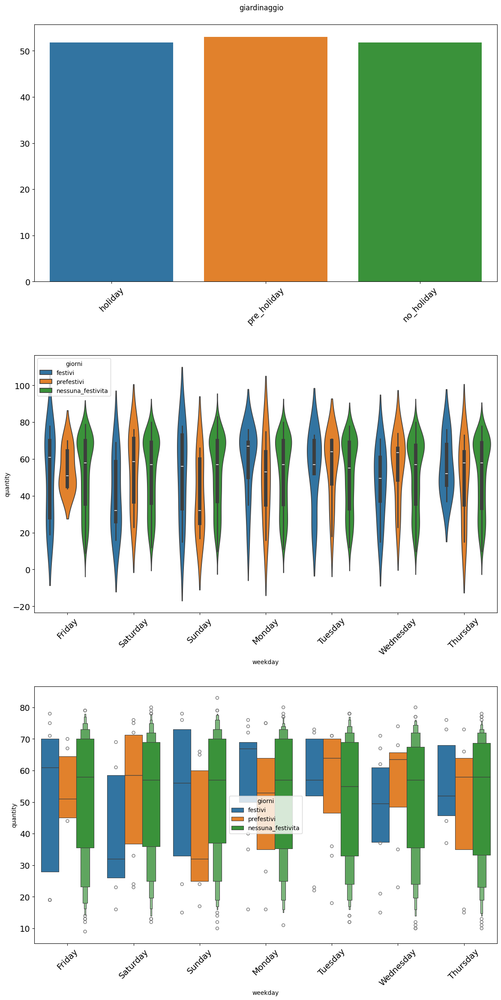

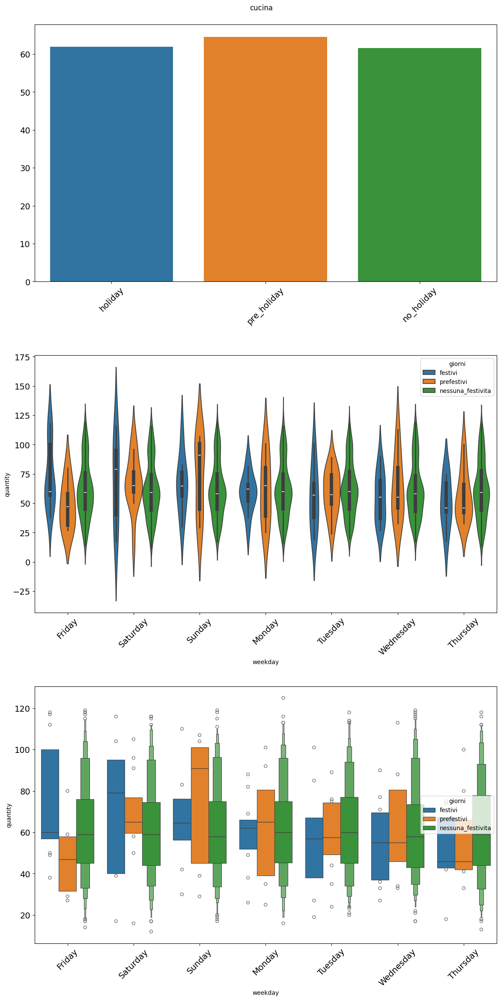

In [78]:
# ciclando sulle singole categorie possiamo evidenziare
# la distribuzione delle vendite a secondo della tipologia
# di giorno (festivo, pre-festivo e feriale) relativamente
# ai totali ed ai totali per giorno della settimana

for categoria in df_grafici['category'].unique():
    valori_da_visualizzare = [
        media_festivi[categoria],
        media_prefestivi[categoria],
        media_nessuna_festivita[categoria],
    ]

    # creazione di un grafico multiplo che contiene tre
    # sub-grafici disposti verticalmente
    fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, ncols=1, figsize=(14, 24))
    fig.tight_layout(pad=10, w_pad=0.5, h_pad=10)
    fig.suptitle(categoria) # nome della categoria del grafico
    fig.subplots_adjust(top=0.96)

    sns.barplot(y=valori_da_visualizzare, x=['holiday', 'pre_holiday', 'no_holiday'], palette="tab10", hue= ['holiday', 'pre_holiday', 'no_holiday'],  ax=ax1)
    ax1.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax1.tick_params(axis='y', labelsize=14)

    sns.violinplot(x="weekday", y="quantity", hue="giorni", data=df_grafici[df_grafici.category==categoria], ax=ax2)
    ax2.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax2.tick_params(axis='y', labelsize=14)

    sns.boxenplot(x="weekday", y="quantity", hue="giorni", data=df_grafici[df_grafici.category==categoria], ax=ax3)
    ax3.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax3.tick_params(axis='y', labelsize=14)

    plt.show()

### Il black friday influisce nel mercato italiano?

In [79]:
nessuna_festivita = df[(df.holidays == False) & (df.pre_holidays == False)]

# selezione dei giorni festivi che non ricadono nel black friday
festivi = df[(df.holidays == True) & (~ df.index.isin(black_friday))] # il simbolo ~ si ottiene, attivando il tastierino
                                                                     # numerico, con la combinazione dei tasti ALT + 126
                                                                     # e indica una negazione rispetto alla condizione
                                                                     # che precede, nel ns caso serve per selezionare
                                                                     # tutti gli indici di [df] che NON sono presenti
                                                                     # in [black_friday]

prefestivi = df[(df.holidays == False) & (df.pre_holidays == True)]

# selezione dei giorni festivi relativi al black friday
df_black_friday = df[(df.index.isin(black_friday))]

media_festivi = (festivi.sum() / len(festivi))
media_prefestivi = (prefestivi.sum() / len(prefestivi))
media_nessuna_festivita = (nessuna_festivita.sum() / len(nessuna_festivita))
media_black_friday = (df_black_friday.sum() / len (df_black_friday))





/tmp/ipykernel_24081/305343102.py:4: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  festivi = df[(df.holidays == True) & (~ df.index.isin(black_friday))] # il simbolo ~ si ottiene, attivando il tastierino
/tmp/ipykernel_24081/305343102.py:14: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  df_black_friday = df[(df.index.isin(black_friday))]


### Quanto vendiamo mediamente nei giorni festivi, pre festivi e nei giorni lavorativi?

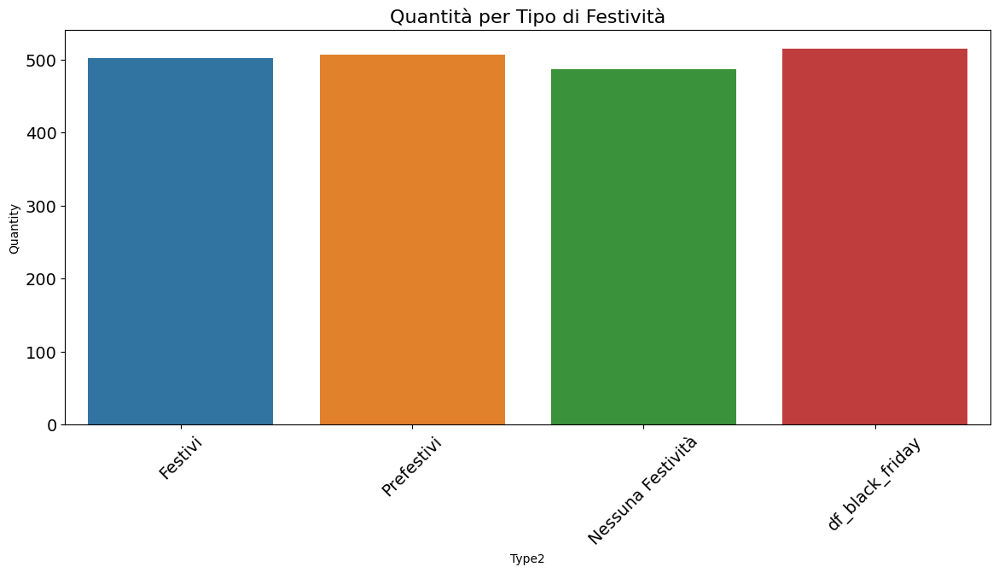

In [80]:
valori_da_visualizzare = [
    media_festivi.drop(['holidays', 'pre_holidays']).sum(),
    media_prefestivi.drop(['holidays', 'pre_holidays']).sum(),
    media_nessuna_festivita.drop(['holidays', 'pre_holidays']).sum(),
    media_black_friday.drop(['holidays', 'pre_holidays']).sum(),
]


# Crea un DataFrame
data2 = pd.DataFrame({
    'Type2': ['Festivi', 'Prefestivi', 'Nessuna Festività', 'df_black_friday'],
    'Quantity': valori_da_visualizzare
})

# Crea il grafico a barre
plt.figure(figsize=(14, 6))
sns.barplot(data=data2, x='Type2', y='Quantity',hue='Type2', palette="tab10", legend=False)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.title('Quantità per Tipo di Festività', fontsize=16)
plt.show()



In [81]:
# creazione delle colonne [holidays], [pre_holidays] e [giorni] nel dataframe df_grafici

df_grafici['holidays'] = False
df_grafici.loc[df_grafici.date.isin(festivita), 'holidays'] = True

df_grafici['pre_holidays'] = df_grafici['holidays'].shift(1)
df_grafici.dropna(inplace=True)

df_grafici['giorni']=''
df_grafici.loc[(df_grafici.holidays == False) & (df_grafici.pre_holidays == False), 'giorni'] = 'nessuna_festivita'
df_grafici.loc[(df_grafici.holidays == True) & (~ df_grafici.index.isin(black_friday)), 'giorni'] = 'festivi'

df_grafici.loc[
    (df_grafici.holidays == False) &
    (df_grafici.pre_holidays == True) &
    (~ df_grafici.index.isin(black_friday)), 'giorni'
]='prefestivi'

df_grafici.loc[( df_grafici.index.isin(black_friday)), 'giorni'] = 'black_friday'

/tmp/ipykernel_24081/2732272888.py:4: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  df_grafici.loc[df_grafici.date.isin(festivita), 'holidays'] = True


In [82]:
# creazione delle colonne [holidays], [pre_holidays] e [giorni] nel dataframe df_grafici_sum

df_grafici_sum['holidays'] = False
df_grafici_sum.loc[df_grafici_sum.index.isin(festivita), 'holidays'] = True

df_grafici_sum['pre_holidays'] = df_grafici_sum['holidays'].shift(1)
df_grafici_sum.dropna(inplace=True)

df_grafici_sum['giorni']=''

df_grafici_sum.loc[
    (df_grafici_sum.holidays == False) & (df_grafici_sum.pre_holidays == False), 'giorni'
] = 'nessuna_festivita'

df_grafici_sum.loc[
    (df_grafici_sum.holidays == True) & (~ df_grafici_sum.index.isin(black_friday)), 'giorni'
] = 'festivi'

df_grafici_sum.loc[
    (df_grafici_sum.holidays == False) &
    (df_grafici_sum.pre_holidays == True) &
    (~ df_grafici_sum.index.isin(black_friday)), 'giorni'
] = 'prefestivi'

df_grafici_sum.loc[( df_grafici_sum.index.isin(black_friday)), 'giorni'] = 'black_friday'

/tmp/ipykernel_24081/3682892088.py:4: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  df_grafici_sum.loc[df_grafici_sum.index.isin(festivita), 'holidays'] = True
/tmp/ipykernel_24081/3682892088.py:16: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  (df_grafici_sum.holidays == True) & (~ df_grafici_sum.index.isin(black_friday)), 'giorni'
/tmp/ipykernel_24081/3682892088.py:22: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appro

<Figure size 1400x600 with 0 Axes>

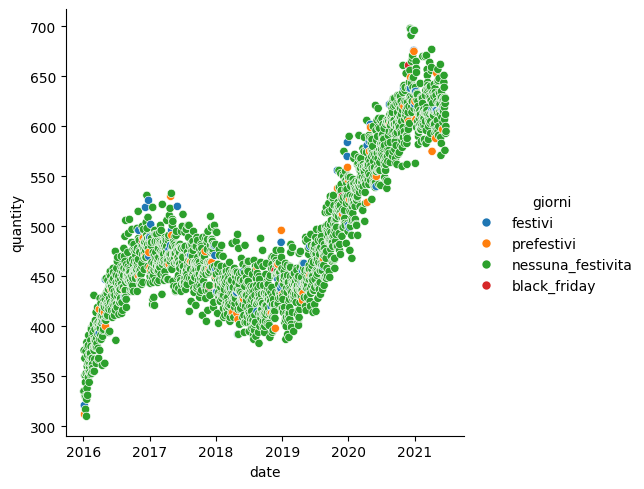

In [83]:
# visualizzazione dell'andamento delle vendite per data e per tipo di giorno

plt.figure(figsize=(14, 6))
sns.relplot(x='date', y='quantity', hue='giorni', data=df_grafici_sum, hue_order=[
    'festivi', 'prefestivi', 'nessuna_festivita', 'black_friday'
])
plt.show()

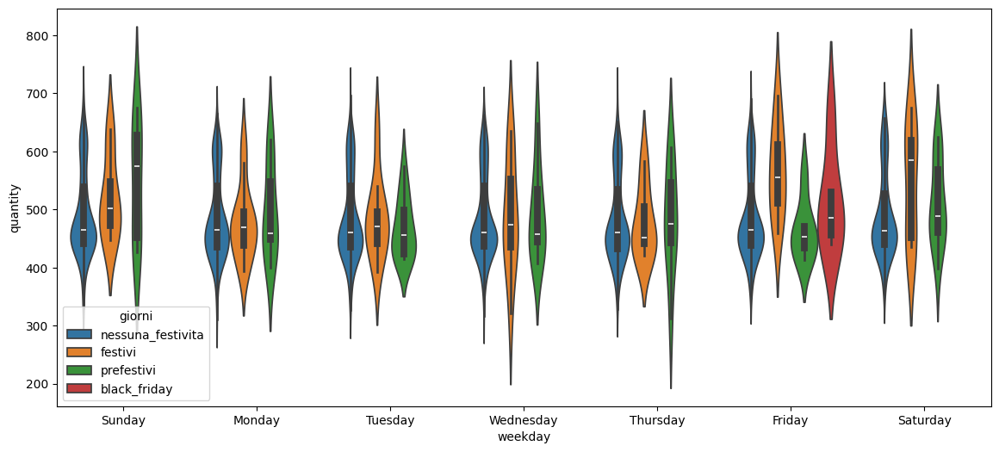

In [84]:
# visualizzazione della distribuzione delle vendite per giorno della settimana
# e per tipo di giorno (il black-friday cade sempre di venerdì)

plt.figure(figsize=(14, 6))
sns.violinplot(x='weekday', y='quantity', hue='giorni', data=df_grafici_sum)
plt.show()

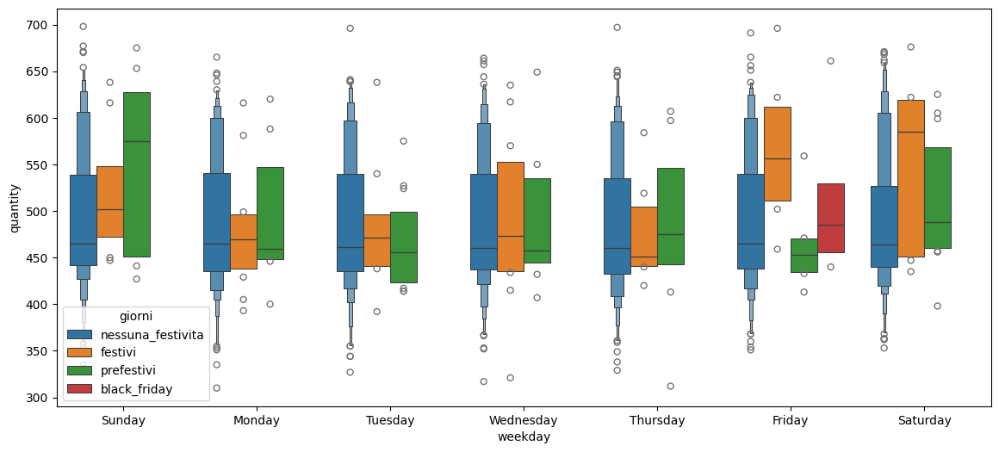

In [85]:
# come nella cella precedente, tramite un BoxenPlot

plt.figure(figsize=(14, 6))
sns.boxenplot(x='weekday', y='quantity', hue='giorni', data=df_grafici_sum)
plt.show()


### Quanto vendiamo mediamente nei giorni festivi, pre festivi e nei giorni lavorativi per le singole categorie?

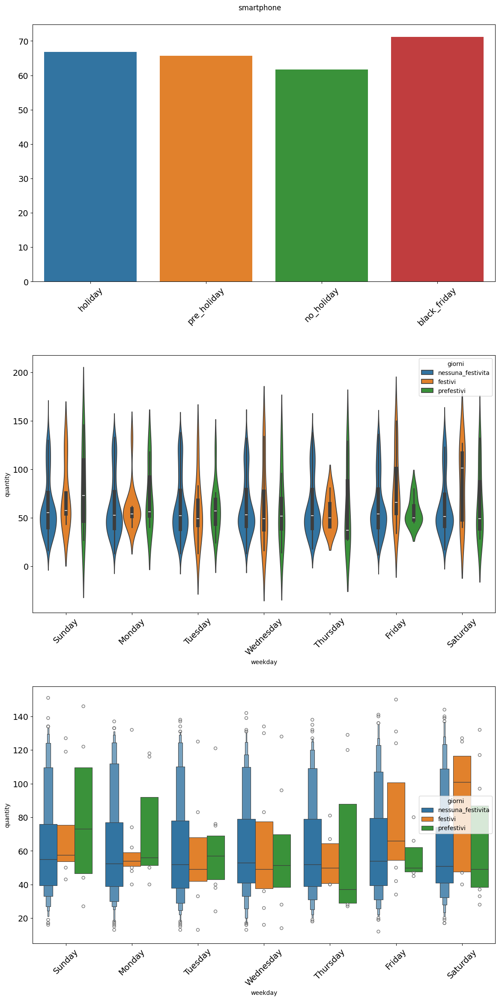

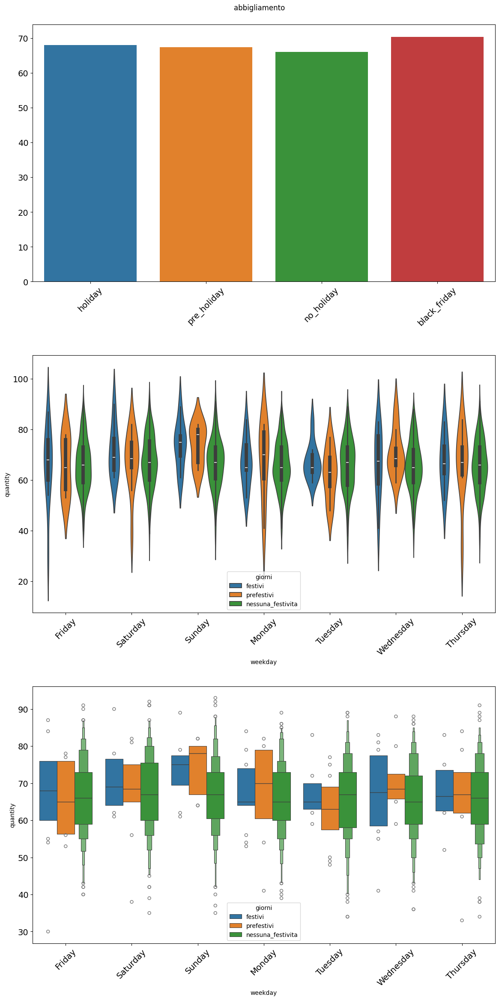

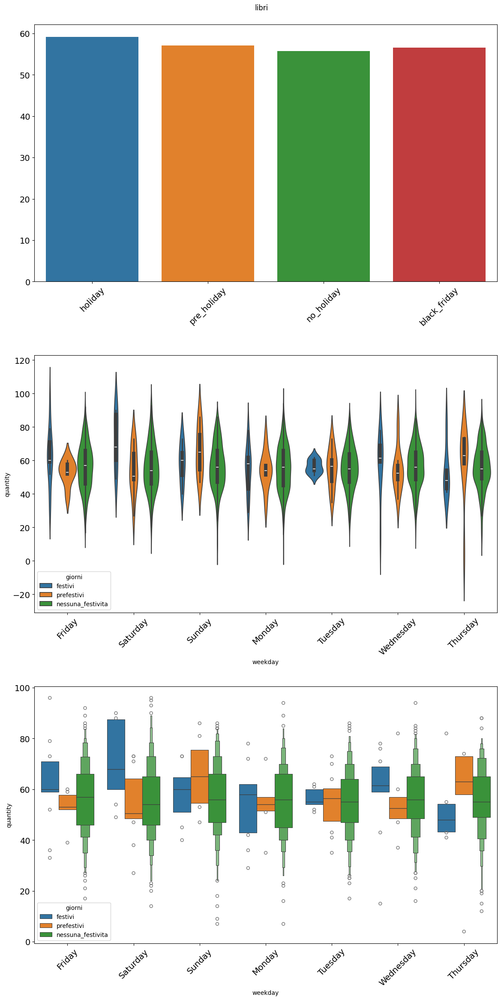

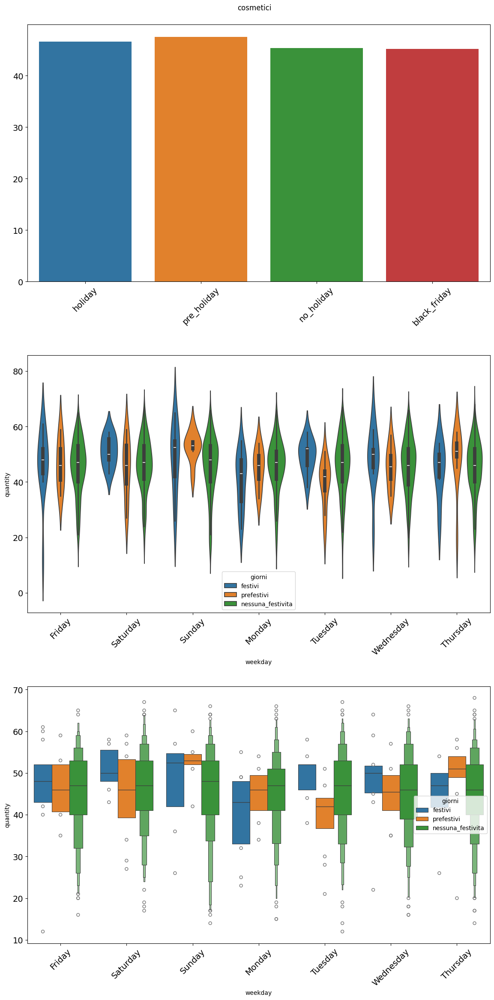

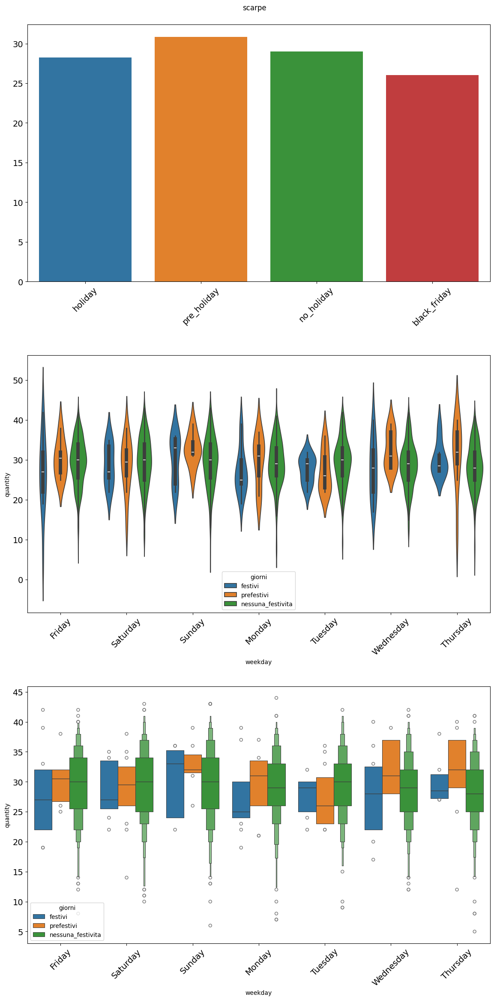

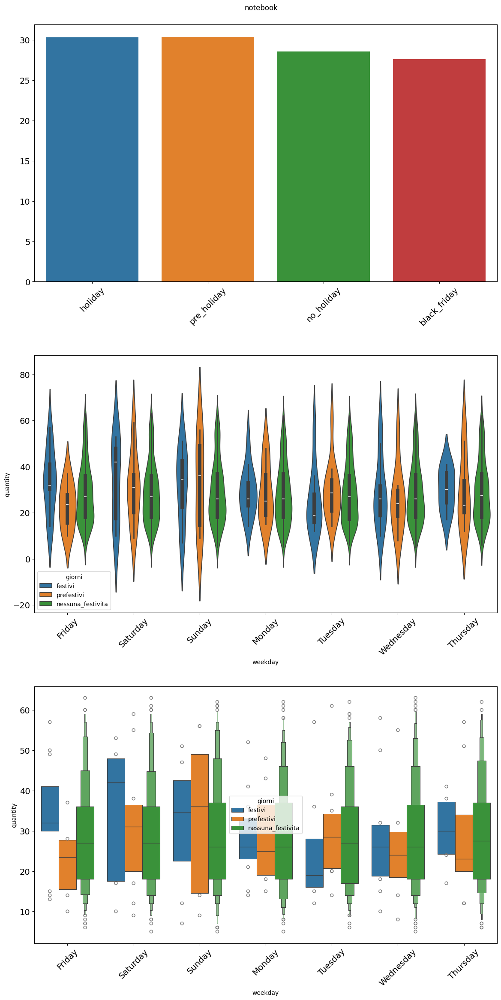

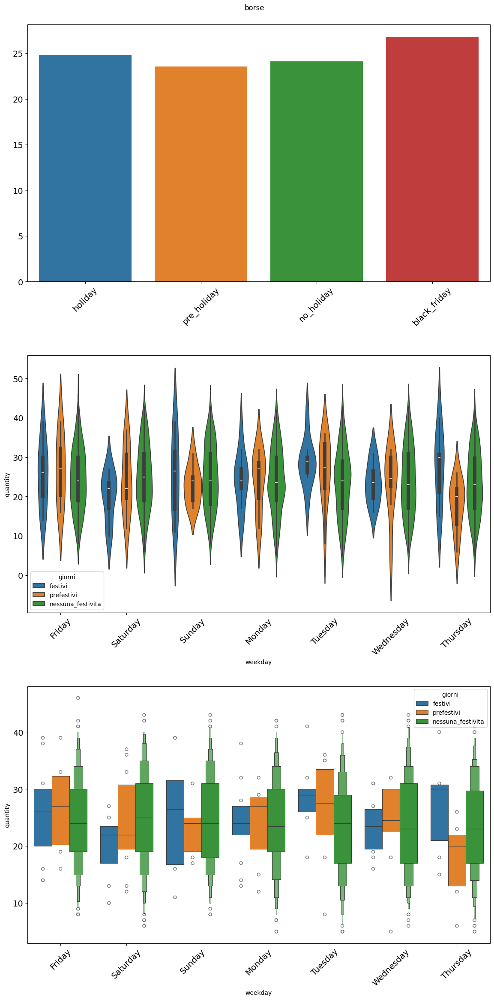

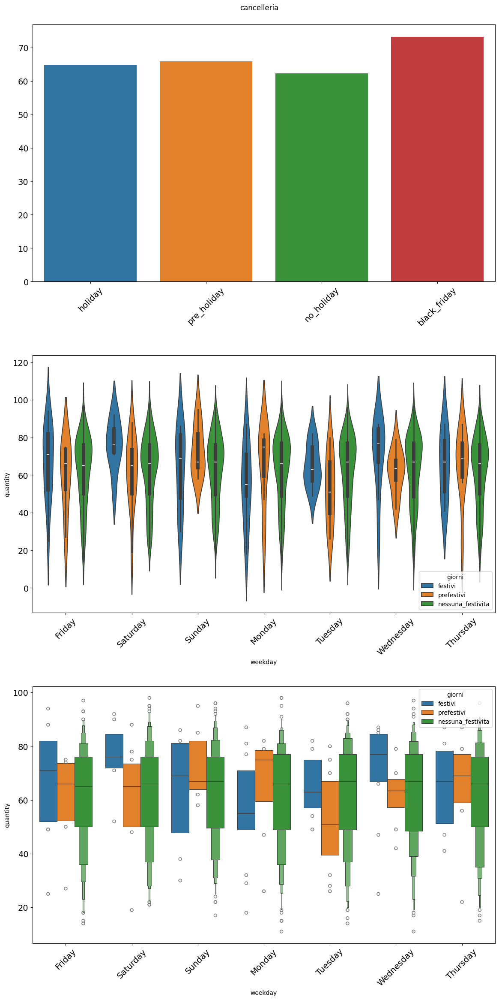

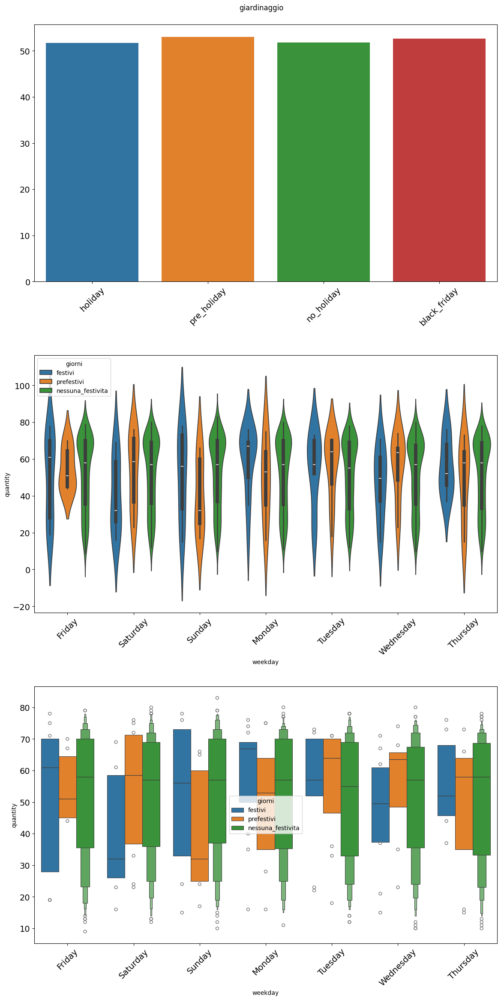

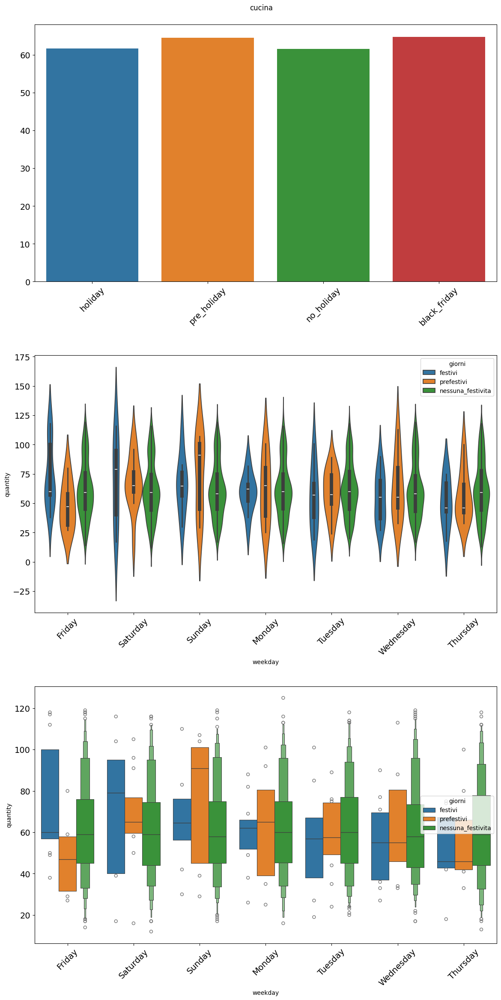

In [87]:
# implementazione di un ciclo per la generazione dei grafici appena realizzati su ogni singola categoria

for categoria in df_grafici['category'].unique():
    valori_da_visualizzare = [
        media_festivi[categoria],
        media_prefestivi[categoria],
        media_nessuna_festivita[categoria],
        media_black_friday[categoria],
    ]

    fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, ncols=1, figsize=(14, 24))
    fig.tight_layout(pad=10, w_pad=0.5, h_pad=10)
    fig.suptitle(f'{categoria}')
    fig.subplots_adjust(top=0.96)

    sns.barplot(y=valori_da_visualizzare, x=['holiday', 'pre_holiday', 'no_holiday', 'black_friday'], palette="tab10", hue = ['holiday', 'pre_holiday', 'no_holiday', 'black_friday'], legend=False, ax=ax1)
    ax1.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax1.tick_params(axis='y', labelsize=14)

    sns.violinplot(x="weekday", y="quantity", hue="giorni", data=df_grafici[df_grafici.category==categoria], ax=ax2)
    ax2.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax2.tick_params(axis='y', labelsize=14)

    sns.boxenplot(x="weekday", y="quantity", hue="giorni", data=df_grafici[df_grafici.category==categoria], ax=ax3)
    ax3.tick_params(axis='x', labelrotation=45, labelsize=14)
    ax3.tick_params(axis='y', labelsize=14)

    plt.show()

Salviamo il dataframe `df` creato fino ad ora in modo da poter sospendere e
riprendere il progetto senza rieseguire tutte le celle precedenti.

In [88]:
# l'opzione [wb] permette di scrivere un file in formato binario
# che è un'operazione generalmente più veloce della scrittura di
# un file in formato testuale in quanto non vengono effettuate
# operazioni di conversione

with open(f'{percorso_base}data.pickle', 'wb') as file:
    pickle.dump(df, file)

Ricarichiamo i dati

In [89]:
with open(f'{percorso_base}data.pickle', 'rb') as file:
    df = pickle.load(file)

In [90]:
df.head()

,smartphone,abbigliamento,libri,cosmetici,scarpe,notebook,borse,cancelleria,giardinaggio,cucina,holidays,pre_holidays
date,,,,,,,,,,,,
2016-01-01,60,30,33,12,6,34,23,25,75,59,True,False
2016-01-02,45,38,27,27,14,36,21,19,71,50,False,False
2016-01-03,51,37,7,23,15,37,16,28,72,49,False,False
2016-01-04,57,39,16,20,19,37,21,15,69,42,False,False
2016-01-05,71,44,25,24,9,41,7,28,70,57,False,True


## Preparazione dati per la nostra tipologia di modello

Creiamo un metodo che ordini i dati e crei il dataframe `df_obiettivo` che aggrega i dati sfruttando una finestra
di 7 giorni che contenga anche il conteggio dei giorni festivi e prefestivi nel periodo considerato

In [65]:
def creazione_df_obbiettivo(df, categorie_target, days=7):
    df.sort_index(inplace=True)
    df_obiettivo = df[categorie_target + ['holidays'] + ['pre_holidays']].rolling(f'{days}d').sum().reset_index()
    df_obiettivo['date'] = (df_obiettivo['date'] - pd.Timedelta(days=days))
    df_obiettivo.set_index('date', inplace=True)

    '''
    esempio di output generato da questo metodo:

                        smartphone  abbigliamento  libri  cosmetici  scarpe  notebook  \
        date
        2015-12-25        60.0           30.0   33.0       12.0     6.0      34.0
        2015-12-26       105.0           68.0   60.0       39.0    20.0      70.0
        2015-12-27       156.0          105.0   67.0       62.0    35.0     107.0
        2015-12-28       213.0          144.0   83.0       82.0    54.0     144.0
        2015-12-29       284.0          188.0  108.0      106.0    63.0     185.0
        2015-12-30       329.0          229.0  123.0      128.0    80.0     215.0
        2015-12-31       388.0          262.0  127.0      148.0    92.0     249.0
        2016-01-01       379.0          272.0  122.0      162.0    94.0     249.0
        2016-01-02       395.0          276.0  117.0      160.0    92.0     253.0
        2016-01-03       406.0          281.0  124.0      154.0    90.0     246.0

                    borse  cancelleria  giardinaggio  cucina  holidays  pre_holidays
        date
        2015-12-25   23.0         25.0          75.0    59.0       1.0           0.0
        2015-12-26   44.0         44.0         146.0   109.0       1.0           0.0
        2015-12-27   60.0         72.0         218.0   158.0       1.0           0.0
        2015-12-28   81.0         87.0         287.0   200.0       1.0           0.0
        2015-12-29   88.0        115.0         357.0   257.0       1.0           1.0
        2015-12-30  107.0        140.0         424.0   297.0       2.0           1.0
        2015-12-31  120.0        162.0         497.0   339.0       2.0           1.0
        2016-01-01  112.0        167.0         488.0   333.0       1.0           1.0
        2016-01-02  109.0        178.0         489.0   329.0       1.0           1.0
        2016-01-03  112.0        167.0         487.0   326.0       1.0           1.0

    '''
    return df_obiettivo

Creiamo un metodo che sfrutti il metodo precedente ed aggiunga ad ogni data l'output desiderato, con suffisso '_target'
 e le festività nei 7 giorni successivi

In [66]:
def prepara_df(df, categorie_target, giorni_previsione=30):
    df_obiettivo = creazione_df_obbiettivo(df, categorie_target, days=giorni_previsione)

    df = df.join(df_obiettivo, how='left', rsuffix='_target')

    df.holidays = df.holidays_target
    df.pre_holidays = df.pre_holidays_target
    df.drop(['holidays_target', 'pre_holidays_target'], axis=1, inplace=True)

    # Aggiungiamo le colonne anno mese giorno e giorno della settimana per poter sfruttare queste informazioni
    df['year'] = df.index.year
    df['month'] = df.index.month
    df['day'] = df.index.day
    df['weekday'] = df.index.weekday

    '''
    esempio di output generato da questo metodo:

                        smartphone  abbigliamento  libri  cosmetici  scarpe  notebook  \
        date
        2016-01-01          60             30     33         12       6        34
        2016-01-02          45             38     27         27      14        36
        2016-01-03          51             37      7         23      15        37
        2016-01-04          57             39     16         20      19        37
        2016-01-05          71             44     25         24       9        41
        2016-01-06          45             41     15         22      17        30
        2016-01-07          59             33      4         20      12        34
        2016-01-08          51             40     28         26       8        34
        2016-01-09          61             42     22         25      12        40
        2016-01-10          62             42     14         17      13        30

                    borse  cancelleria  giardinaggio  cucina  ...  scarpe_target  \
        date                                                  ...
        2016-01-01     23           25            75      59  ...           94.0
        2016-01-02     21           19            71      50  ...           92.0
        2016-01-03     16           28            72      49  ...           90.0
        2016-01-04     21           15            69      42  ...           86.0
        2016-01-05      7           28            70      57  ...           87.0
        2016-01-06     19           25            67      40  ...           87.0
        2016-01-07     13           22            73      42  ...           80.0
        2016-01-08     15           30            66      53  ...           87.0
        2016-01-09     18           30            72      46  ...           87.0
        2016-01-10     19           17            70      46  ...           87.0

                    notebook_target  borse_target  cancelleria_target  \
        date
        2016-01-01            249.0         112.0               167.0
        2016-01-02            253.0         109.0               178.0
        2016-01-03            246.0         112.0               167.0
        2016-01-04            245.0         106.0               163.0
        2016-01-05            239.0         118.0               149.0
        2016-01-06            245.0         110.0               143.0
        2016-01-07            247.0         111.0               141.0
        2016-01-08            249.0         109.0               126.0
        2016-01-09            249.0          98.0               123.0
        2016-01-10            252.0          94.0               136.0

                    giardinaggio_target  cucina_target  year  month  day  weekday
        date
        2016-01-01                488.0          333.0  2016      1    1        4
        2016-01-02                489.0          329.0  2016      1    2        5
        2016-01-03                487.0          326.0  2016      1    3        6
        2016-01-04                494.0          349.0  2016      1    4        0
        2016-01-05                495.0          345.0  2016      1    5        1
        2016-01-06                494.0          344.0  2016      1    6        2
        2016-01-07                489.0          347.0  2016      1    7        3
        2016-01-08                501.0          348.0  2016      1    8        4
        2016-01-09                493.0          352.0  2016      1    9        5
        2016-01-10                491.0          361.0  2016      1   10        6

    '''

    return df

In [67]:
def creazione_np(df, giorni, inizio, intervallo_di_date):
    '''
    Costruiamo i dataset con cui addestrare il modello nel formato NumPy che si aspetta il framework da noi utilizzato
    sfruttando i dataframe e i parametri di configurazione ricevuti in input
    '''
    # selezione delle colonne che non hanno il suffisso [_target]
    colonne = [col for col in df.columns if not col.endswith("_target")]

    # selezione delle colonne che hanno il suffisso [_target]
    colonne_obbiettivo = [col for col in df.columns if col.endswith("_target")]

    np_input = []
    np_output = []

    for n in range(len(colonne_obbiettivo)):
        np_output.append([])

    for date in intervallo_di_date:
        if date > inizio + timedelta(days=giorni - 1):
            inputs = df.loc[date - timedelta(days=giorni - 1):date, colonne].values
            output = df.loc[date, colonne_obbiettivo].values

            if len(inputs) == giorni:
                np_input.append(inputs)
                for n in range(len(colonne_obbiettivo)):
                    np_output[n].append([output[n]])
            else:
                print(inputs.shape)
                raise Exception('Dati non conformi')
        else:
            raise Exception('Date non sufficienti')

    np_input = np.asarray(np_input, dtype=np.float32)
    np_output = np.asarray(np_output, dtype=np.float32)
    return np_input, np_output

In [68]:
# implementazione di alcuni metodi utili ai
# processi di normalizzazione e denormalizzazione

def normalizza_np(np_cumulativo, np_max, np_min, a=0.8, b=0.2):
    '''
    Normalizzazione MinMax parametrica
    '''
    np_normalizzato = (((np_cumulativo - np_min) / (np_max - np_min)) * (a - b)) + b
    np_normalizzato = np.nan_to_num(np_normalizzato, nan=b, posinf=a, neginf=b)
    return np_normalizzato


def normalizza_input(np_array):
    '''
    Normalizzazione degli input e restituzione dei vettori massimo e minimo
    '''
    np_max = np.max(np_array, axis=(0, 1), keepdims=True)
    np_min = np.min(np_array, axis=(0, 1), keepdims=True)
    np_array = normalizza_np(np_array, np_max, np_min)
    return np_array, np_max, np_min


def normalizza_output(np_array):
    '''
    Normalizzazione degli output e restituzione dei vettori massimo e minimo
    '''
    np_max = np.max(np_array, axis=(1, 2), keepdims=True)
    np_min = np.min(np_array, axis=(1, 2), keepdims=True)
    np_array = normalizza_np(np_array, np_max, np_min)
    return np_array, np_max, np_min


def denormalizza_np(np_normalizzato, np_max, np_min, a=0.8, b=0.2):
    np_denormalizzato = (((np_normalizzato - b) / (a - b)) * (np_max - np_min)) + np_min
    return np_denormalizzato

In [69]:
# implementazione di alcuni metodi
# necessari al controllo di conformità
# del dataset creato

def controllo_presenza_di_valori_nan(np_input, np_output):
    if np.isnan(np.sum(np_input)):
        raise Exception('Rilevati NaN su np_input')
    np_output = np.asarray(np_output, dtype=np.float32)
    if np.isnan(np.sum(np_output)):
        raise Exception('Rilevati NaN su np_output')

def controllo_normalizzazione(np_input, np_output, a=0.8, b=0.2):
    if (np_input < b).any() or (np_input > a).any():
        raise Exception('Normalizzazione fallita per np_input')
    if (np_output < b).any() or (np_output > a).any():
        raise Exception('Normalizzazione fallita per np_output')

def controllo_presenza_di_valori_inf(np_input, np_output):
    if np.isinf(np.sum(np_input)):
        raise Exception('Rilevati inf su np_input')
    if np.isinf(np.sum(np_output)):
        raise Exception('Rilevati inf su np_output')
        

In [70]:
# costruiamo il dataset che raccoglie tutte le
# informazioni da fornire in input al modello predittivo

def creazione_dataset(
        df,
        giorni=365,  # n° giorni della sequenza temporale di un esempio - un anno
        giorni_addestramento=1096,  # n° esempi di train - tre anni
        giorni_test=7,  # n° esempi di test - una settimana
        giorni_validazione=14,  # n° esempi di validazione (usata anche per selezionare il miglior modello)
        data_iniziale=None,
):
    # recupero data iniziale dall'indice del dataset
    if data_iniziale is None:
        data_iniziale = df.index.min().to_pydatetime()
    else:
        data_iniziale = max(df.index.min().to_pydatetime(), data_iniziale)

    inizio_train = data_iniziale + timedelta(days=giorni)
    fine_train = inizio_train + timedelta(days=giorni_addestramento - 1)

    inizio_val_e_test = fine_train - timedelta(days=giorni_validazione - 1)
    fine_val_e_test = inizio_val_e_test + timedelta(days=giorni_test) + timedelta(days=giorni_validazione - 1)

    intervallo_di_date_train = pd.date_range(inizio_train, fine_train, freq='D').tolist()
    intervallo_di_date_val_e_test = pd.date_range(inizio_val_e_test, fine_val_e_test, freq='D').tolist()

    colonne_obbiettivo = [col for col in df.columns if col.endswith("_target")]
    indici_categorie = {}

    for n, target_col in enumerate(colonne_obbiettivo):
        indici_categorie[n] = target_col.replace('_target', '')

    np_input_train, np_output_train = creazione_np(df, giorni, data_iniziale, intervallo_di_date_train)

    np_input_val_e_test, np_output_val_e_test = creazione_np(df, giorni, data_iniziale, intervallo_di_date_val_e_test)

    np_input_train, input_max, input_min = normalizza_input(np_input_train)

    np_output_train, output_max, output_min = normalizza_output(np_output_train)

    np_input_val_e_test = normalizza_np(np_input_val_e_test, input_max, input_min)

    np_output_val_e_test = normalizza_np(np_output_val_e_test, output_max, output_min)

    controllo_presenza_di_valori_nan(np_input_train, np_output_train)
    controllo_presenza_di_valori_nan(np_input_val_e_test, np_output_val_e_test)

    controllo_presenza_di_valori_inf(np_input_train, np_output_train)
    controllo_presenza_di_valori_inf(np_input_val_e_test, np_output_val_e_test)

    controllo_normalizzazione(np_input_train, np_output_train)

    # visualizzazione dimensioni dataset a scopo di debug

    print('\n\n--dataset creati--')
    print('Input:', np_input_train.shape)
    print('Output   :', np_output_train.shape)

    print('\n\n--dataset creati Validazione e Test-------------------------')
    print('Input:', np_input_val_e_test.shape)
    print('Output   :', np_output_val_e_test.shape)
    print('\n\n----------------------------------------------')

    return (
        np_input_train,
        np_output_train,
        np_input_val_e_test,
        np_output_val_e_test,
        output_max,
        output_min,
        input_max,
        input_min,
        indici_categorie,
    )

## Modello Predittivo
Creiamo una funzione per generare il modello, in questo modo sarà possibile
richiamare questa funzione all'interno di un ciclo più complesso che governerà
l'intero addestramento.

La seguente immagine illustra l'architettura generale del modello, un'architettura seq-2-seq che
codifica le serie temporali di input in una meta-rappresentazione intermedia, creata dalla rete
stessa, utile ad essere decodificata in modo diverso per ogni categoria:

<img src='images/arch_01.png'>

#### Blocchi di Pre-Processing e Post-Processing

<img src='images/arch_02.png'>

Il **blocco di pre-processing** si occupa di aumentare lo spazio di dimensionale in cui l'input
è descritto tramite un layer convolutivo con kernel pari ad 1, per poi passarlo ad un blocco
Transformer che si occupa di analizzare la sequenza di input indipendentemente dal preciso
ordine con cui gli elementi della sequenza di input sono descritti; eventuali correlazioni
non lineari presenti tra gli elementi della sequenza potranno essere così evidenziate.
La nuova sequenza generata dal blocco Transformer è analizzata da un layer ricorrente con
architettura LSTM, in grado di ri-elaborare le sequenze fornite in input, anche in funzione
della memoria/stato interno ad ogni cella di questo layer, con lo scopo di avere in output
una nuova sequenza di mappe di feature utili a rappresentare lo stato delle vendite
descritto dall'input originale.
La sequenza di mappe di feature generata dal blocco di Pre-Processing dovrà essere quanto
più utile possibile alla previsione delle vendite per ognuna delle 10 categorie merceologiche
considerate.

Il **blocco di post-processing** ha un'architettura simile al blocco di pre-processing, in
maniera analoga decodifica le sequenze fornite in input in funzione però di una singola
categoria merceologica su cui effettuare le previsioni, sfruttando le sequenze di
caratteristiche estratte dal blocco di pre-processing.
Tre layer LSTM concludono ognuno dei 10 blocchi di post-processing, permettendo un'elaborazione
sempre più complessa di quanto codificato e decodificato dai due blocchi Transformer presenti
nel blocco di pre-processing e in ogni blocco di post-processing.

I blocchi Transformer utilizzati modificano l'architettura originale, utilizzando due layer
convolutivi al posto dei layer Feed-Forward e l'applicazione dei "rubinetti" tipici delle
architetture **HighWay** al posto delle comuni addizioni.
I layer convolutivi usati hanno kernel differente e il loro risultato è sommato, forzando
così i due diversi kernel a configurarsi su valori "comodi" ad entrambi.
Il seguente diagramma ne illustra i dettagli:


<img src='images/arch_03.png'>

L'architettura del blocco HighWay utilizzata è descritta nel seguente diagramma:

<img src='images/arch_04.png'>

In [71]:
def get_highway_block(input, input_processed):
    # completare il blocco HighWay con le sua tipica
    # funzione di attivazione
    T = tf.keras.layers.Conv1D(
        input.shape[-1],
        kernel_size=1,
        activation='sigmoid',
        bias_initializer=tf.keras.initializers.Constant(42.)
    )(input)
    only_ones = tf.keras.layers.Lambda(lambda x: tf.keras.backend.ones_like(x))(T)
    _T = tf.keras.layers.Subtract()([only_ones, T])
    _input = tf.keras.layers.Multiply()([input, T])
    _input_processed = tf.keras.layers.Multiply()([input_processed, _T])
    return tf.keras.layers.Add()([_input_processed, _input])

def get_transformer_block(inputs, num_heads, dim, dropout=0.):
    # la modifica all'architettura originale coinvolge l'utilizzo di
    # due layer convolutivi con kernel 3 e 7 al posto dei layer Feed-Forward
    # e l'applicazione del meccanismo di addizione delle architetture HighWay
    # -------
    # sfruttare i precedenti diagrammi per completare il codice sorgente
    # del blocco Transformer custom implementato
    att_output = tf.keras.layers.MultiHeadAttention(
        num_heads=num_heads,
        key_dim=dim
    )(inputs, inputs)
    att_output = tf.keras.layers.Dropout(dropout)(att_output)
    att_output = get_highway_block(inputs, att_output)
    att_output = tf.keras.layers.LayerNormalization(epsilon=1e-9)(att_output)
    conv_3 = tf.keras.layers.Conv1D(dim, kernel_size=3, activation='swish', padding='same')(att_output)
    conv_7 = tf.keras.layers.Conv1D(dim, kernel_size=7, activation='swish', padding='same')(att_output)
    conv = tf.keras.layers.Add()([conv_3, conv_7])
    conv_1 = tf.keras.layers.Conv1D(dim, kernel_size=1)(conv)
    conv_1 = tf.keras.layers.Dropout(dropout)(conv_1)
    output = get_highway_block(conv_1, att_output)
    output = tf.keras.layers.LayerNormalization(epsilon=1e-9)(output)
    return output

def crea_modello(np_input, np_output, cells=64, lr=0.001, dropout=0.):
    tf.keras.backend.clear_session() # pulisce la memoria usata da Keras
                                     # per mantenere uno stato tra diversi
                                     # modelli istanziati; con [clear_session]
                                     # liberiamo la memoria da refusi di
                                     # precedenti test, senza riavviare il
                                     # notebook, utile in caso di ottimizzazione
                                     # degli iper-parametri del modello, per
                                     # poter effettuare n test consecutivi
    net_inputs = tf.keras.layers.Input(
        shape=(np_input.shape[1:]),
        name='inputs'
    )

    half_cells = int(cells / 2)
    quarter_cells = int(cells / 4)
    eighth_cells = int(cells / 8)

    external_block = tf.keras.layers.Conv1D(quarter_cells, kernel_size=1)(net_inputs)
    external_block = get_transformer_block(inputs=external_block, num_heads=quarter_cells, dim=quarter_cells, dropout=dropout)
    external_block = tf.keras.layers.LSTM(quarter_cells, dropout=dropout, return_sequences=True)(external_block)

    net_outputs = []
    for _ in range(np_output.shape[0]):
        _tpe = tf.keras.layers.Conv1D(cells, kernel_size=1)(external_block)
        _tpe = get_transformer_block(inputs=_tpe, num_heads=eighth_cells, dim=cells, dropout=dropout)

        _out_n = tf.keras.layers.LSTM(half_cells, return_sequences=True)(_tpe)
        _out_n = tf.keras.layers.LSTM(half_cells, return_sequences=True)(_out_n)

        _out = tf.keras.layers.LSTM(1)(_out_n)
        net_outputs.append(_out)

    model = tf.keras.Model(
        inputs=net_inputs,
        outputs=net_outputs
    )

    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            epsilon=1e-9,
            learning_rate=lr
        ),
        loss=tf.keras.losses.mae
    )
    return model

Creiamo una callback che usi e visualizzi le metriche usate.

In [72]:
class SupervisoreAddestramento(tf.keras.callbacks.Callback):
    def __init__(self, np_input_val_e_test, np_output_val_e_test, giorni_validazione,
                 indici_categorie, inizio_loss=999999, model_weight_dir='./weights',
                 verbose=True):
        super(SupervisoreAddestramento, self).__init__()

        self.errs_validazione_mean = inizio_loss
        self.errs_validazione_perc_mean = 1
        self.model_weight_dir = model_weight_dir

        self.np_input_val_e_test = np_input_val_e_test
        # siccome gli output proposti dal modello sono ognuno una lista
        # con dentro un solo valore, riduciamo le dimensioni per velocizzare
        # i successivi calcoli
        self.np_output_val_e_test = np_output_val_e_test[:, :, 0]
        self.giorni_validazione = giorni_validazione
        self.indici_categorie = indici_categorie
        self.verbose = verbose

    def on_epoch_end(self, epoch, logs=None):
        weight_saved = False  # usato solo per il log dell'addestramento
                              # che riporterà, per ogni epoca, l'errore
                              # medio in valore assoluto, l'errore medio
                              # percentuale in valore assoluto e l'errore
                              # quadratico medio. Queste metriche sono
                              # calcolate sul dataset di validazione e di
                              # test al termine di ogni epoca.
        loss = logs['loss']
        predizioni = self.model.predict([self.np_input_val_e_test])
        predizioni = np.asarray(predizioni, dtype=np.float32)
        if predizioni.ndim == 3:
            predizioni = predizioni[:, :, 0]

        elif predizioni.ndim == 2:
            predizioni = predizioni.transpose()

        errori = (self.np_output_val_e_test - predizioni)

        # calcolo degli errori in validazione e in test
        # facciamo ciò per poter salvare i migliori pesi
        # (usando solo i valori di validazione per decidere)
        # e per avere un log più dettagliato di come si
        # addestra il modello

        errori_validazione = errori[:, :self.giorni_validazione]
        errori_test = errori[:, self.giorni_validazione:]

        errs_validazione = np.abs(errori_validazione)

        mse_errs_validazione = ((errori_validazione) ** 2).mean()

        errs_validazione_mean = np.mean(errs_validazione)
        errs_validazione_max = np.max(errs_validazione)
        errs_validazione_min = np.min(errs_validazione)

        errs_validazione_perc = errs_validazione / self.np_output_val_e_test[:, :self.giorni_validazione]

        # [masked_invalid] permette di effettuare un calcolo (la media, il massimo o il minimo)
        # ignorando gli eventuali valori NaN derivanti da divisioni per quantità vendute pari
        # a zero, presenti nei dati di input
        errs_validazione_perc_mean = np.ma.masked_invalid(errs_validazione_perc).mean()
        errs_validazione_perc_max = np.ma.masked_invalid(errs_validazione_perc).max()
        errs_validazione_perc_min = np.ma.masked_invalid(errs_validazione_perc).min()

        errs_test = np.abs(errori_test)

        mse_errs_test = ((errori_test) ** 2).mean()

        errs_test_mean = np.mean(errs_test)
        errs_test_max = np.max(errs_test)
        errs_test_min = np.min(errs_test)

        errs_test_perc = np.abs(errs_test / self.np_output_val_e_test[:, self.giorni_validazione:])

        errs_test_perc_mean = np.ma.masked_invalid(errs_test_perc).mean()
        errs_test_perc_max = np.ma.masked_invalid(errs_test_perc).max()
        errs_test_perc_min = np.ma.masked_invalid(errs_test_perc).min()

        errs_test_mean_col = np.mean(errs_test, axis=1)
        errs_test_max_col = np.max(errs_test, axis=1)
        errs_test_min_col = np.min(errs_test, axis=1)

        errs_test_perc_mean_col = np.mean(errs_test_perc, axis=1)
        errs_test_perc_max_col = np.max(errs_test_perc, axis=1)
        errs_test_perc_min_col = np.min(errs_test_perc, axis=1)

        logs['val_loss'] = errs_validazione_mean
        logs['test_loss'] = errs_test_mean

        if errs_validazione_perc_mean < self.errs_validazione_perc_mean:
            # nel momento in cui il modello migliora in validazione
            # salviamo i pesi (parametri) del modello per poterli
            # usare successivamente
            self.model.save_weights(self.model_weight_dir)
            weight_saved = True

            self.loss = loss

            self.mse_errs_validazione = mse_errs_validazione
            self.errs_validazione_mean = errs_validazione_mean
            self.errs_validazione_max = errs_validazione_max
            self.errs_validazione_min = errs_validazione_min

            self.errs_validazione_perc_mean = errs_validazione_perc_mean
            self.errs_validazione_perc_max = errs_validazione_perc_max
            self.errs_validazione_perc_min = errs_validazione_perc_min

            self.mse_errs_test = mse_errs_test

            self.errs_test_mean = errs_test_mean
            self.errs_test_max = errs_test_max
            self.errs_test_min = errs_test_min

            self.errs_test_perc_mean = errs_test_perc_mean
            self.errs_test_perc_max = errs_test_perc_max
            self.errs_test_perc_min = errs_test_perc_min

        print('*' if weight_saved else ' ', ' Epoca', epoch,
              '\tloss {:<12}'.format(loss).ljust(25),
              'mse test {:<12}'.format(mse_errs_test).ljust(35),
              'mae % test {:<12}'.format("{:.9f}".format(errs_test_perc_mean)).ljust(25),
              'mae test {:<12}'.format("{:.9f}".format(errs_test_mean)).ljust(25),
              'mae % val {:<12}'.format("{:.9f}".format(errs_validazione_perc_mean)).ljust(25),
              "mae val {:<12}".format("{:.9f}".format(errs_validazione_mean)).ljust(25),
              '\t', datetime.now().strftime("%H:%M:%S"))
        if self.verbose:
            print(
                '.......................................................................................................')
            print('\r', '*' if weight_saved else ' ', epoch,
                  '\t', "indice".ljust(20), 'nome'.ljust(25), '   ',
                  '\t', "errore % val".ljust(25),
                  '\t', 'data', )

            for i, (
                    err_mean_col,
                    err_max_col,
                    err_min_col,
                    err_perc_mean,
                    err_perc_max,
                    err_perc_min
            ) in enumerate(zip(
                errs_test_mean_col,
                errs_test_max_col,
                errs_test_min_col,
                errs_test_perc_mean_col,
                errs_test_perc_max_col,
                errs_test_perc_min_col
            )):
                print('\r', '*' if weight_saved else ' ', epoch,
                      ('\t%f' % self.lr).ljust(20),
                      '\t', "{:<12}".format(i).ljust(20), self.indici_categorie[i].ljust(25), '   ',
                      '\t', "{:<12}".format("{:.9f}".format(err_perc_mean)).ljust(25),
                      '\t', datetime.now().strftime("%H:%M:%S"), )

### Configurazione dell'addestramento

Nella seguente cella vengono configurati i principali iper-parametri che governano l'addestramento.
In questo modo questa cella risulta utile per poter effettuare velocemente dei test su iper-parametri diversi e,
contemporaneamente, fa da riepilogo per le impostazioni utilizzate.

In [73]:
date_inizio = (min(df.index))

giorni_previsione = 7

giorni_addestramento = 1024
giorni = 64
giorni_validazione = 7
giorni_test = 7

epochs = 500
batch = 256

cells = 64
lr = 0.001
dropout = 0.5

categorie_target = [x for x in df.columns.to_list() if x not in ['holidays', 'pre_holidays']]

### Creiamo il dataset

In [74]:
base_internal_dir = f"./weights/weights_{datetime.now().strftime('%Y-%m-%d_%H-%M-%S')}/"

model_weight_dir = f"{base_internal_dir}weights"

if not os.path.exists(base_internal_dir):
    os.makedirs(base_internal_dir)

df_prepared = prepara_df(df.copy(), categorie_target, giorni_previsione=giorni_previsione)
with open(f"{base_internal_dir}df.pickle", "wb") as file:
    pickle.dump(df_prepared, file)

(
    np_input_train,
    np_output_train,
    np_input_val_e_test,
    np_output_val_e_test,
    output_max,
    output_min,
    input_max,
    input_min,
    indici_categorie,
 ) = creazione_dataset(
    df_prepared.copy(),
    giorni=giorni,
    giorni_addestramento=giorni_addestramento,
    giorni_test=giorni_test,
    giorni_validazione=giorni_validazione,
    data_iniziale=inizio
)



--dataset creati--
Input: (1024, 64, 16)
Output   : (10, 1024, 1)


--dataset creati Validazione e Test-------------------------
Input: (14, 64, 16)
Output   : (10, 14, 1)


----------------------------------------------


### Creiamo la rete

In [75]:

# Crea il modello
model = crea_modello(
    np_input=np_input_train,
    np_output=np_output_train,
    cells= 64,
    lr=0.001,
    dropout=0.5
)

I0000 00:00:1729590284.861748     929 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1729590285.261937     929 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1729590285.262001     929 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1729590285.266556     929 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:00:1729590285.266668     929 cuda_executor.cc:1001] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
I0000 00:0

### Stampiamo la struttura della rete

In [77]:
model.summary()
tf.keras.utils.plot_model(model, expand_nested=True, show_shapes=True)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ inputs (InputLayer) │ (None, 64, 16)    │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 64, 16)    │        272 │ inputs[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 64, 16)    │        272 │ conv1d[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 16)    │     17,168 │ conv1d[0][0],     │
│ (MultiHeadAttentio… │                   │            │ conv1d[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 64, 16)    │          0 │ conv1d_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 64, 16)    │          0 │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ subtract (Subtract) │ (None, 64, 16)    │          0 │ lambda[0][0],     │
│                     │                   │            │ conv1d_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_1          │ (None, 64, 16)    │          0 │ dropout_1[0][0],  │
│ (Multiply)          │                   │            │ subtract[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 64, 16)    │          0 │ conv1d[0][0],     │
│                     │                   │            │ conv1d_1[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 64, 16)    │          0 │ multiply_1[0][0], │
│                     │                   │            │ multiply[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 64, 16)    │         32 │ add[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 64, 16)    │        784 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 64, 16)    │      1,808 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 64, 16)    │          0 │ conv1d_2[0][0],   │
│                     │                   │            │ conv1d_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_4 (Conv1D)   │ (None, 64, 16)    │        272 │ add_1[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 64, 16)    │          0 │ conv1d_4[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_5 (Conv1D)   │ (None, 64, 16)    │        272 │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_1 (Lambda)   │ (None, 64, 16)    │          0 │ conv1d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ subtract_1          │ (None, 64, 16)    │          0 │ lambda_1[0][0],   │
│ (Subtract)          │                   │            │ conv1d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_3          │ (None, 64, 16)    │          0 │ layer_normalizat… │
│ (Multiply)          │                   │            │ subtract_1[0][0]  │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 2,107,584 (8.04 MB)

 Trainable params: 2,107,584 (8.04 MB)

 Non-trainable params: 0 (0.00 B)

### Avviamo l'addestramento

In [82]:
supervisore = SupervisoreAddestramento(
    model_weight_dir='./model_weights.weights.h5',
    np_input_val_e_test=np_input_val_e_test,
    np_output_val_e_test=np_output_val_e_test,
    giorni_validazione=7,
    indici_categorie=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
    verbose=False
)

history = model.fit(
    [np_input_train,],
    list(np_output_train),
    batch_size=32,
    epochs=500,
    callbacks=supervisore,
    verbose=0,
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
*  Epoca 0 	loss 0.6435909271240234  mse test 0.006713089998811483       mae % test 0.189013672    mae test 0.071221061      mae % val 0.160412952     mae val 0.070334077       	 11:48:47
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
   Epoca 1 	loss 0.5746554136276245  mse test 0.013396711088716984       mae % test 0.282207162    mae test 0.096179739      mae % val 0.184877477     mae val 0.078563169       	 11:48:58
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
   Epoca 2 	loss 0.5332798957824707  mse test 0.011721095070242882       mae % test 0.259522465    mae test 0.093552813      mae % val 0.194976670     mae val 0.084950656       	 11:49:08
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
*  Epoca 3 	loss 0.5100972652435303  mse test 0.010179285891354084       mae % test 0.221448517    mae test 0.081247211      mae % val 0.140552684     mae val 0.065091401       	 11:49:20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
   Epoca 4 	loss 0.47730889916419983 mse test 0.0108300

In [ ]:
supervisore = SupervisoreAddestramento(
    model_weight_dir='./weights/',
    np_input_val_e_test=np_input_val_e_test,
    np_output_val_e_test=np_output_val_e_test,
    giorni_validazione=7,
    indici_categorie='category',
    verbose=False
)

history = model.fit(
    [np_input_train,],
    list(np_output_train),
    batch_size=32,
    epochs=500,
   # callbacks=callbacks,
    verbose=0,
)

### Salviamo i dati di addestramento

In [83]:
with open(f'{base_internal_dir}history.pickle', 'wb') as file:
    pickle.dump(history.history, file)

conf_addestramento = {
    'internal_dir': base_internal_dir,
    'target': categorie_target,
    'giorni': giorni,
    'giorni_previsione': giorni_previsione,
    'giorni_addestramento': giorni_addestramento,
    'giorni_test': giorni_test,
    'giorni_validazione': giorni_validazione,
    'date_inizio': inizio,
    'epochs': epochs,
    'batch': batch,
    'lr': lr,
    'cells': cells,
    'loss': supervisore.loss,
    'mse_errs_validazione': supervisore.mse_errs_validazione,
    'errs_validazione_mean': supervisore.errs_validazione_mean,
    'errs_validazione_max': supervisore.errs_validazione_max,
    'errs_validazione_min': supervisore.errs_validazione_min,
    'errs_validazione_perc_mean': supervisore.errs_validazione_perc_mean,
    'errs_validazione_perc_max': supervisore.errs_validazione_perc_max,
    'errs_validazione_perc_min': supervisore.errs_validazione_perc_min,
    'mse_errs_test': supervisore.mse_errs_test,
    'errs_test_mean': supervisore.errs_test_mean,
    'errs_test_max': supervisore.errs_test_max,
    'errs_test_min': supervisore.errs_test_min,
    'errs_test_perc_mean': supervisore.errs_test_perc_mean,
    'errs_test_perc_max': supervisore.errs_test_perc_max,
    'errs_test_perc_min': supervisore.errs_test_perc_min,
    'output_max': output_max,
    'output_min': output_min,
    'input_max': input_max,
    'input_min': input_min,
    'indici_categorie': indici_categorie,
}

with open(f'{base_internal_dir}hist.pickle', 'wb') as file:
    pickle.dump(conf_addestramento, file)

## Carichiamo lo storico dell'ultimo addestramento

In [84]:
date = []
for dir in os.listdir('./weights/'):
    if dir.startswith('weights_'):
        data = dir[len('weights_'):]
        data = datetime.strptime(data, '%Y-%m-%d_%H-%M-%S')
        date.append(data)
data = max(date)

base_dir = f"./weights/weights_{data.strftime('%Y-%m-%d_%H-%M-%S')}/"

with open(f'{base_dir}hist.pickle', 'rb') as file:
    conf_addestramento = pickle.load(file)

percorso_dei_pesi = f'{conf_addestramento["internal_dir"]}weights'
with open(f'{conf_addestramento["internal_dir"]}history.pickle', 'rb') as file:
    history = pickle.load(file)

with open(f'{conf_addestramento["internal_dir"]}df.pickle', 'rb') as file:
    df_selected = pickle.load(file)

### Creazione dataset per utilizzarlo solo per le previsioni

In [85]:
(
    np_input_train,
    np_output_train,
    np_input_test,
    np_output_test,
    output_max,
    output_min,
    input_max,
    input_min,
    indici_categorie,
) = creazione_dataset(
    df_selected,
    giorni=conf_addestramento['giorni'],
    giorni_addestramento=conf_addestramento['giorni_addestramento'],
    giorni_test=conf_addestramento['giorni_test'],
    giorni_validazione=0,  # per avere solo i dati di test
    data_iniziale=conf_addestramento['date_inizio']
)



--dataset creati--
Input: (1024, 64, 16)
Output   : (10, 1024, 1)


--dataset creati Validazione e Test-------------------------
Input: (7, 64, 16)
Output   : (10, 7, 1)


----------------------------------------------


### Ricreiamo il modello

In [92]:
model = crea_modello(np_input_train, np_output_train, conf_addestramento['cells'])
model.load_weights('./model_weights.weights.h5')

/home/linux/myenv/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 716 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


### Analizziamo i risultati dell'addestramento

In [93]:
np_output_test_reduced = np_output_test[:, :, 0]

predizioni = model.predict([np_input_test, ])
predizioni = np.asarray(predizioni, dtype=np.float32)

if predizioni.ndim == 3:
    predizioni = predizioni[:, :, 0]

elif predizioni.ndim == 2:
    predizioni = predizioni.transpose()

errs = np.abs(np_output_test_reduced - predizioni)

errs_mean = np.mean(errs)
errs_max = np.max(errs)
errs_min = np.min(errs)

errs_mean_col = np.mean(errs, axis=1)
errs_max_col = np.max(errs, axis=1)
errs_min_col = np.min(errs, axis=1)

errs_perc = errs / np_output_test_reduced

errs_perc_mean = np.mean(errs_perc)
errs_perc_max = np.max(errs_perc)
errs_perc_min = np.min(errs_perc)

errs_perc_mean_col = np.mean(errs_perc, axis=1)
errs_perc_max_col = np.max(errs_perc, axis=1)
errs_perc_min_col = np.min(errs_perc, axis=1)

for i, (
    err_mean_col,
    err_max_col,
    err_min_col,
    err_perc_mean,
    err_perc_max,
    err_perc_min
) in enumerate(zip(
    errs_mean_col,
    errs_max_col,
    errs_min_col,
    errs_perc_mean_col,
    errs_perc_max_col,
    errs_perc_min_col
)):
    print('\t', "{:<12}".format(i).ljust(2), ' ', str(indici_categorie[i]).ljust(25), '   ',
          '\t', "{:<12}".format("{:.9f}".format(err_perc_mean)),
          '\t', datetime.now().strftime("%H:%M:%S"))

W0000 00:00:1729597607.540739    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.552022    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.556828    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.560902    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.564485    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.568446    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.572052    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.575400    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.578947    1096 gp

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
	 0              smartphone                    	 0.180416316  	 13:46:48
	 1              abbigliamento                 	 0.046909183  	 13:46:48
	 2              libri                         	 0.036860254  	 13:46:48
	 3              cosmetici                     	 0.037019048  	 13:46:48
	 4              scarpe                        	 0.064138167  	 13:46:48
	 5              notebook                      	 0.154325023  	 13:46:48
	 6              borse                         	 0.088676438  	 13:46:48
	 7              cancelleria                   	 0.017379705  	 13:46:48
	 8              giardinaggio                  	 0.440098792  	 13:46:48
	 9              cucina                        	 0.207145020  	 13:46:48


W0000 00:00:1729597607.944819    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.945581    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.946337    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.947097    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.947868    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.948611    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.949496    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.950885    1096 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597607.953008    1096 gp

### Viualizzazione dell'errore del modello durante l'addestramento

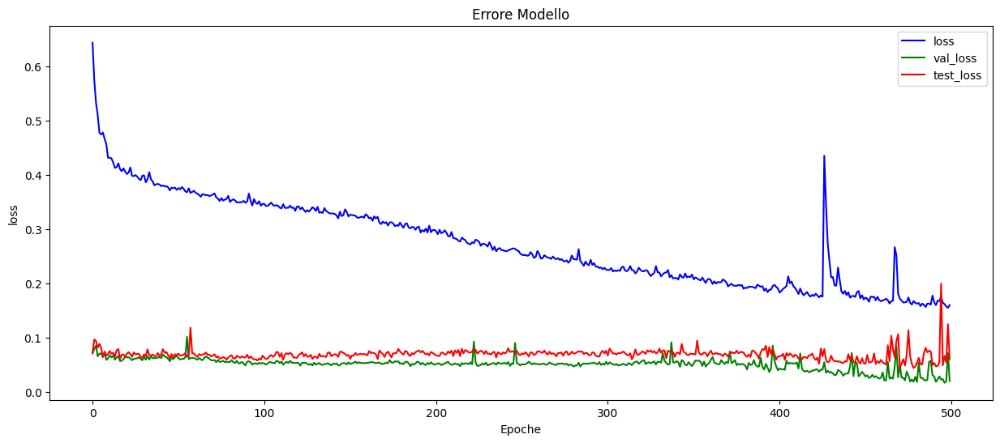

In [94]:
plt.figure(figsize=(15, 6))
plt.plot(history['loss'], color='blue', label='loss')
plt.plot(history['val_loss'], color='green', label='val_loss')
plt.plot(history['test_loss'], color='red', label='test_loss')
plt.title('Errore Modello')
plt.ylabel('loss')
plt.xlabel('Epoche')
plt.legend()
plt.show()

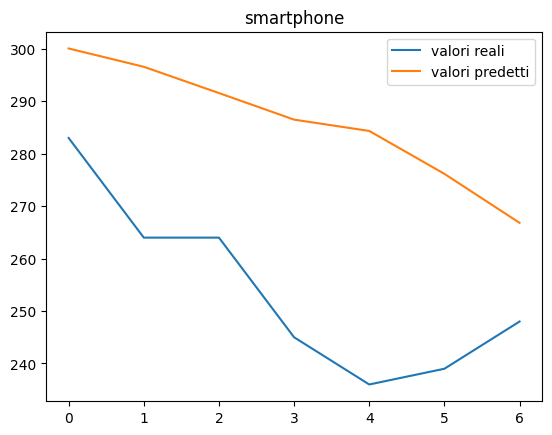

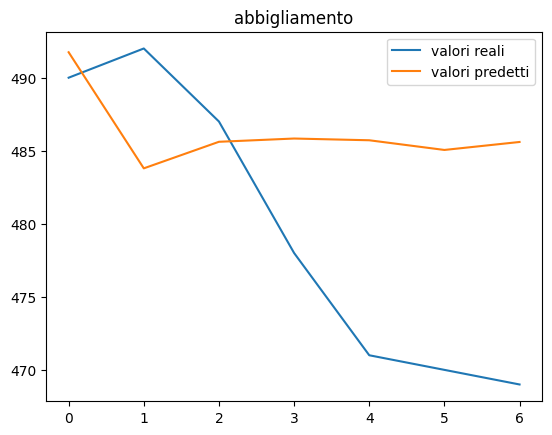

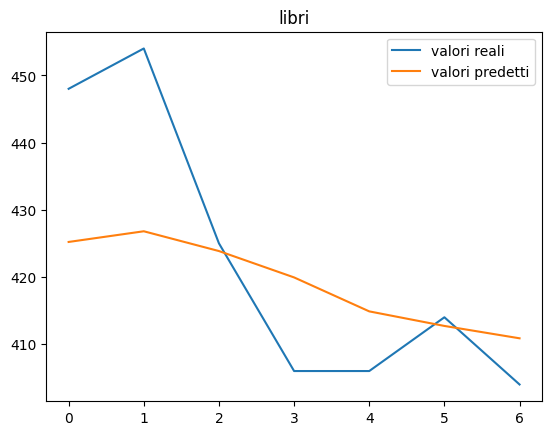

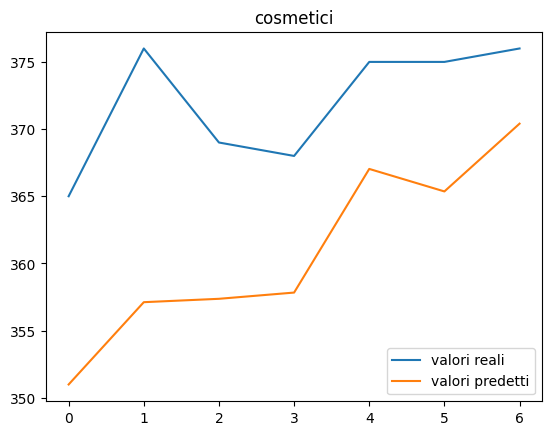

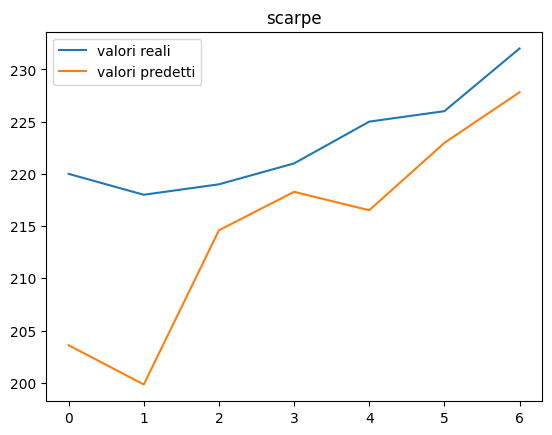

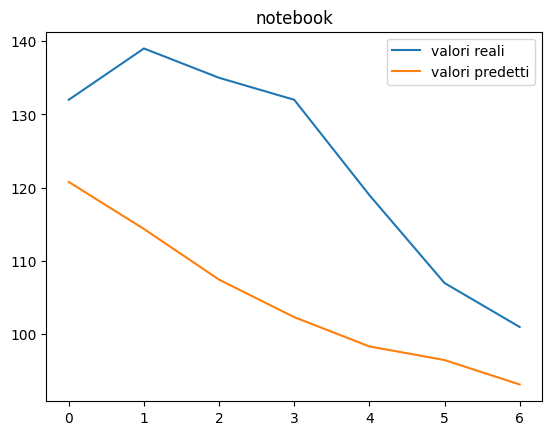

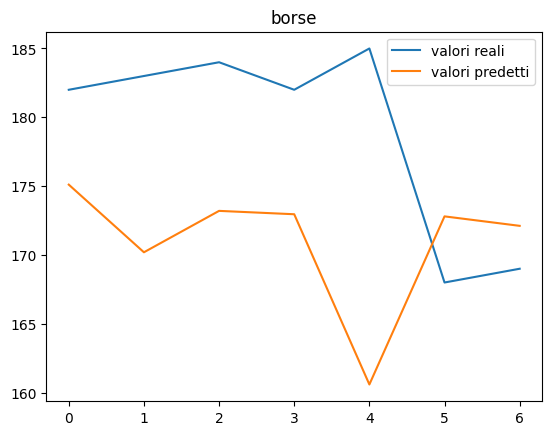

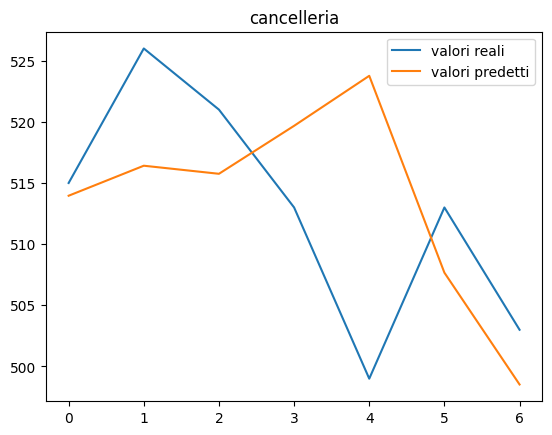

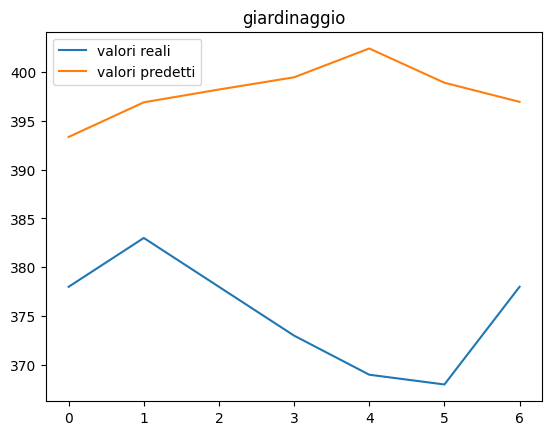

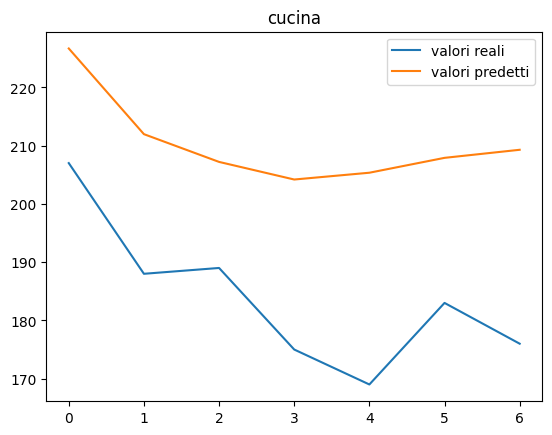

In [95]:
np_output_test_denorm = denormalizza_np(np_output_test_reduced, output_max[:, :, 0], output_min[:, :, 0])
predizioni_denorm = denormalizza_np(predizioni, output_max[:, :, 0], output_min[:, :, 0])

for n, (o, i) in enumerate(zip(np_output_test_denorm, predizioni_denorm)):
    plt.title(indici_categorie[n])
    plt.plot(o, label='valori reali')
    plt.plot(i, label='valori predetti')
    plt.legend()
    plt.show()

Come evidenziato dai precedenti grafici, il modello ha una buona accuratezza nel prevedere le vendite per categoria
nei successivi 7gg; osservare le y su ogni grafico per avere un'idea ancora più precisa di come, molto spesso, le
differenze sono veramente basse.
Spcialmente per fini di gestione magazzino e ottimizzazione delle campagne di marketing risulta essere uno strumento
utile; inoltre riesce a generalizzare abbastanza bene anche sul lungo periodo, indicando quasi sempre correttamente i
trend futuri di ogni categoria, come si evince dalle successive celle.


### Testiamo il tutto su un periodo più lungo (30gg)

In [96]:
(
    np_input_train,
    np_output_train,
    np_input_test,
    np_output_test,
    output_max,
    output_min,
    input_max,
    input_min,
    indici_categorie,
) = creazione_dataset(
    df_selected,
    giorni=conf_addestramento['giorni'],
    giorni_addestramento=conf_addestramento['giorni_addestramento'],
    giorni_test=30,
    giorni_validazione=0,
    data_iniziale=conf_addestramento['date_inizio']
)



--dataset creati--
Input: (1024, 64, 16)
Output   : (10, 1024, 1)


--dataset creati Validazione e Test-------------------------
Input: (30, 64, 16)
Output   : (10, 30, 1)


----------------------------------------------


### Analizziamo i risultati dell'addestramento

In [97]:
np_output_test_reduced = np_output_test[:, :, 0]

predizioni = model.predict([np_input_test, ])
predizioni = np.asarray(predizioni, dtype=np.float32)

if predizioni.ndim == 3:
    predizioni = predizioni[:, :, 0]

elif predizioni.ndim == 2:
    predizioni = predizioni.transpose()

errs = np.abs(np_output_test_reduced - predizioni)

errs_mean = np.mean(errs)
errs_max = np.max(errs)
errs_min = np.min(errs)

errs_mean_col = np.mean(errs, axis=1)
errs_max_col = np.max(errs, axis=1)
errs_min_col = np.min(errs, axis=1)

errs_perc = errs / np_output_test_reduced

errs_perc_mean = np.mean(errs_perc)
errs_perc_max = np.max(errs_perc)
errs_perc_min = np.min(errs_perc)

errs_perc_mean_col = np.mean(errs_perc, axis=1)
errs_perc_max_col = np.max(errs_perc, axis=1)
errs_perc_min_col = np.min(errs_perc, axis=1)

for i, (
    err_mean_col,
    err_max_col,
    err_min_col,
    err_perc_mean,
    err_perc_max,
    err_perc_min
) in enumerate(zip(
    errs_mean_col,
    errs_max_col,
    errs_min_col,
    errs_perc_mean_col,
    errs_perc_max_col,
    errs_perc_min_col
)):
    print('\t', "{:<12}".format(i).ljust(2), ' ', str(indici_categorie[i]).ljust(25), '   ',
          '\t', "{:<12}".format("{:.9f}".format(err_perc_mean)),
          '\t', datetime.now().strftime("%H:%M:%S"))

W0000 00:00:1729597823.281528    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.287222    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.291701    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.300785    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.306055    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.309874    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.320445    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.325873    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.335461    1098 gp

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
	 0              smartphone                    	 0.141268522  	 13:50:23
	 1              abbigliamento                 	 0.069489591  	 13:50:23
	 2              libri                         	 0.045351613  	 13:50:23
	 3              cosmetici                     	 0.042394996  	 13:50:23
	 4              scarpe                        	 0.068016969  	 13:50:23
	 5              notebook                      	 0.067607976  	 13:50:23
	 6              borse                         	 0.146049395  	 13:50:23
	 7              cancelleria                   	 0.041104686  	 13:50:23
	 8              giardinaggio                  	 0.603522658  	 13:50:23
	 9              cucina                        	 0.175111711  	 13:50:23


W0000 00:00:1729597823.494842    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.495752    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.496709    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.497591    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.498388    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.499144    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.499883    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.501166    1098 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729597823.502040    1098 gp

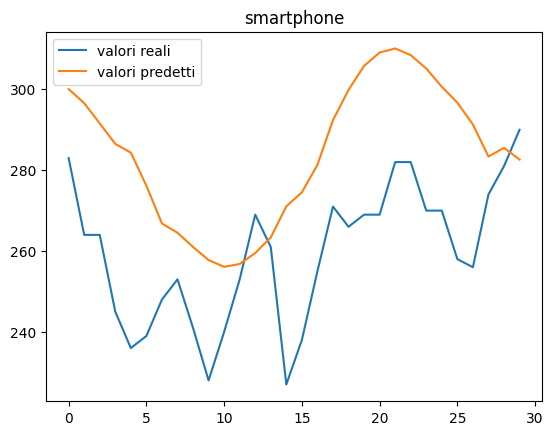

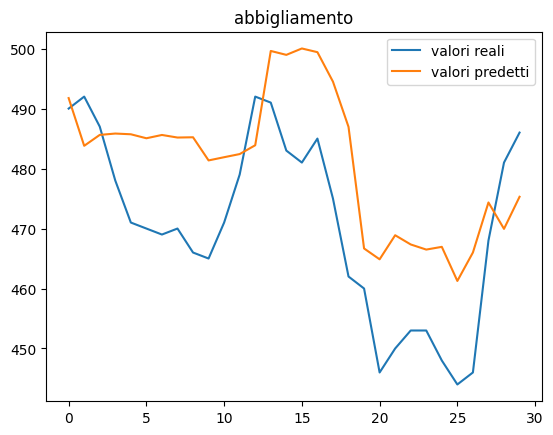

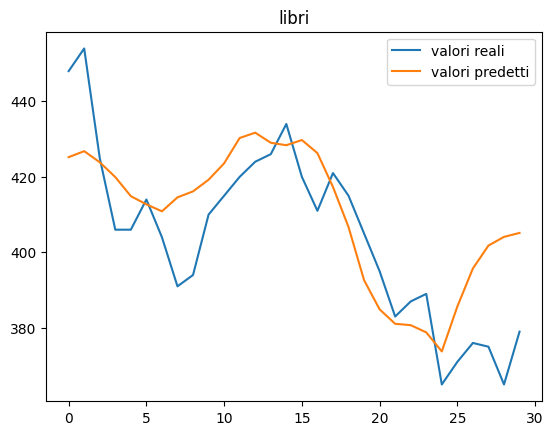

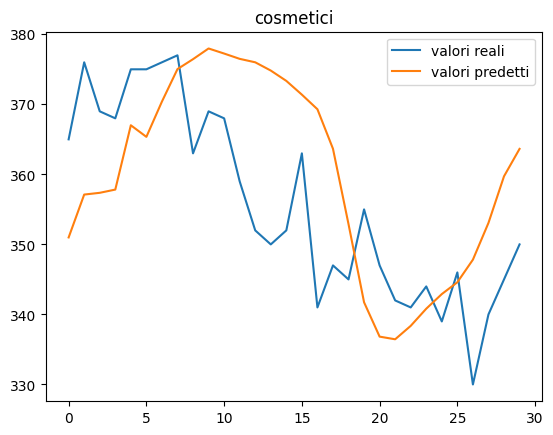

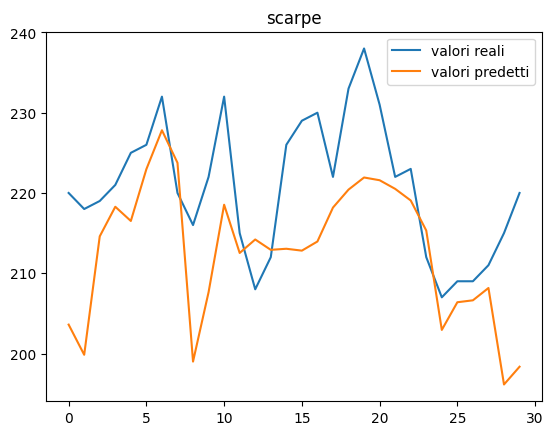

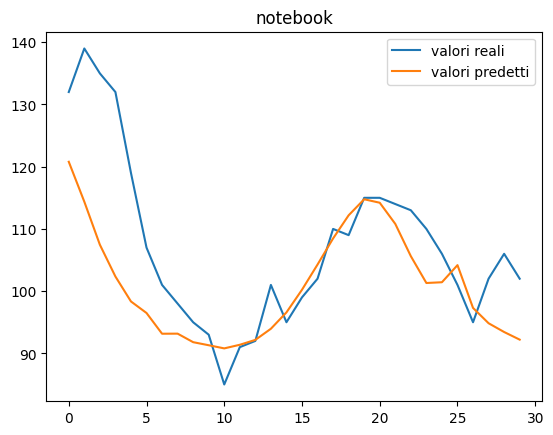

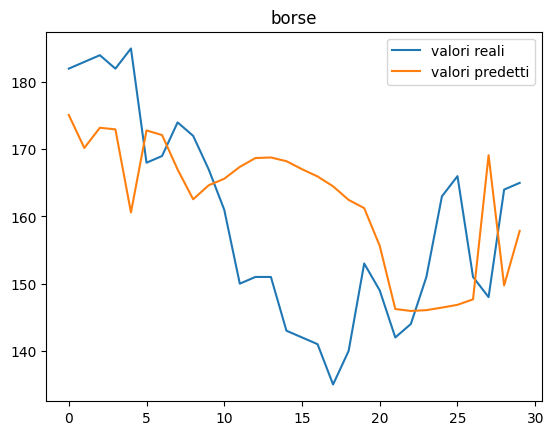

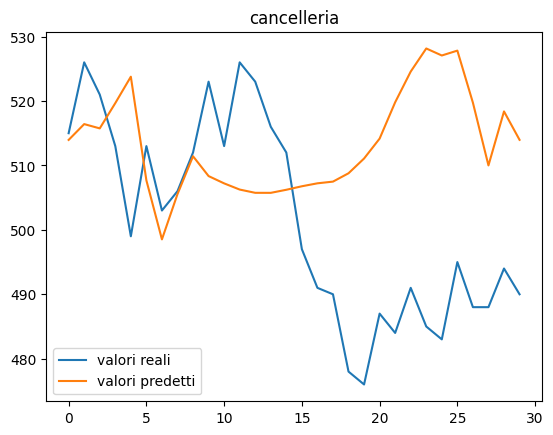

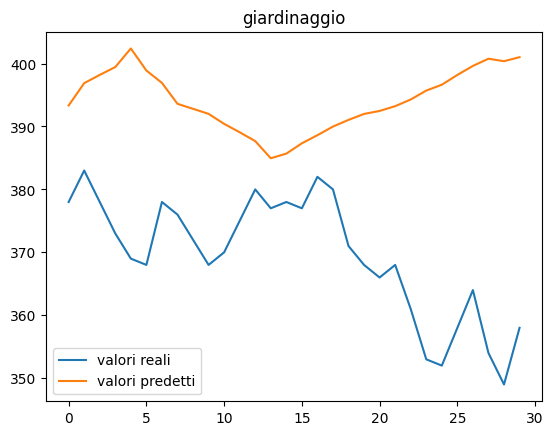

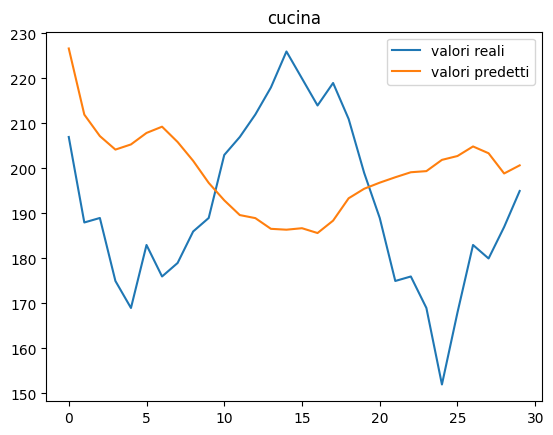

In [98]:
np_output_test_denorm = denormalizza_np(np_output_test_reduced, output_max[:, :, 0], output_min[:, :, 0])
predizioni_denorm = denormalizza_np(predizioni, output_max[:, :, 0], output_min[:, :, 0])

for n, (o, i) in enumerate(zip(np_output_test_denorm, predizioni_denorm)):
    plt.title(indici_categorie[n])
    plt.plot(o, label='valori reali')
    plt.plot(i, label='valori predetti')
    plt.legend()
    plt.show()